<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Imports-+-Constants" data-toc-modified-id="Imports-+-Constants-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Imports + Constants</a></span></li><li><span><a href="#Load-Incountry-Folds" data-toc-modified-id="Load-Incountry-Folds-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Load Incountry Folds</a></span></li><li><span><a href="#Helper-methods" data-toc-modified-id="Helper-methods-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Helper methods</a></span></li><li><span><a href="#LSMSDeltaIncountry" data-toc-modified-id="LSMSDeltaIncountry-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>LSMSDeltaIncountry</a></span><ul class="toc-item"><li><span><a href="#Load-saved-preds-+-features" data-toc-modified-id="Load-saved-preds-+-features-4.1"><span class="toc-item-num">4.1&nbsp;&nbsp;</span>Load saved preds + features</a></span></li><li><span><a href="#PCA-&amp;-t-SNE-features" data-toc-modified-id="PCA-&amp;-t-SNE-features-4.2"><span class="toc-item-num">4.2&nbsp;&nbsp;</span>PCA &amp; t-SNE features</a></span></li><li><span><a href="#Evaluate" data-toc-modified-id="Evaluate-4.3"><span class="toc-item-num">4.3&nbsp;&nbsp;</span>Evaluate</a></span></li><li><span><a href="#Fine-Tune-Final-Layer-with-Cross-Validation" data-toc-modified-id="Fine-Tune-Final-Layer-with-Cross-Validation-4.4"><span class="toc-item-num">4.4&nbsp;&nbsp;</span>Fine Tune Final Layer with Cross-Validation</a></span></li><li><span><a href="#Evaluate" data-toc-modified-id="Evaluate-4.5"><span class="toc-item-num">4.5&nbsp;&nbsp;</span>Evaluate</a></span></li><li><span><a href="#Effect-of-household-size" data-toc-modified-id="Effect-of-household-size-4.6"><span class="toc-item-num">4.6&nbsp;&nbsp;</span>Effect of household size</a></span></li><li><span><a href="#Visualize-best-and-worst-predictions" data-toc-modified-id="Visualize-best-and-worst-predictions-4.7"><span class="toc-item-num">4.7&nbsp;&nbsp;</span>Visualize best and worst predictions</a></span></li></ul></li><li><span><a href="#LSMSIndexOfDeltaIncountry" data-toc-modified-id="LSMSIndexOfDeltaIncountry-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>LSMSIndexOfDeltaIncountry</a></span><ul class="toc-item"><li><span><a href="#Load-saved-preds-+-features" data-toc-modified-id="Load-saved-preds-+-features-5.1"><span class="toc-item-num">5.1&nbsp;&nbsp;</span>Load saved preds + features</a></span></li><li><span><a href="#PCA-&amp;-t-SNE-features" data-toc-modified-id="PCA-&amp;-t-SNE-features-5.2"><span class="toc-item-num">5.2&nbsp;&nbsp;</span>PCA &amp; t-SNE features</a></span></li><li><span><a href="#Evaluate" data-toc-modified-id="Evaluate-5.3"><span class="toc-item-num">5.3&nbsp;&nbsp;</span>Evaluate</a></span></li><li><span><a href="#Fine-Tune-Final-Layer-with-Cross-Validation" data-toc-modified-id="Fine-Tune-Final-Layer-with-Cross-Validation-5.4"><span class="toc-item-num">5.4&nbsp;&nbsp;</span>Fine Tune Final Layer with Cross-Validation</a></span></li><li><span><a href="#Evaluate" data-toc-modified-id="Evaluate-5.5"><span class="toc-item-num">5.5&nbsp;&nbsp;</span>Evaluate</a></span></li><li><span><a href="#Effect-of-household-size" data-toc-modified-id="Effect-of-household-size-5.6"><span class="toc-item-num">5.6&nbsp;&nbsp;</span>Effect of household size</a></span></li><li><span><a href="#Visualize-best-and-worst-predictions" data-toc-modified-id="Visualize-best-and-worst-predictions-5.7"><span class="toc-item-num">5.7&nbsp;&nbsp;</span>Visualize best and worst predictions</a></span></li><li><span><a href="#Variation-by-geolevel" data-toc-modified-id="Variation-by-geolevel-5.8"><span class="toc-item-num">5.8&nbsp;&nbsp;</span>Variation by geolevel</a></span></li></ul></li></ul></div>

# Imports + Constants

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
import os
import sys
import time

import matplotlib.pyplot as plt
import numpy as np
import pickle
import pandas as pd
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
import tensorflow as tf

sys.path.append('../')
from batchers import batcher, dataset_constants
from models.linear_model import train_linear_logo
from utils.analysis import evaluate_df, calc_score
from utils.general import load_npz, colordisplay
from utils.geo_plot import plot_locs
from utils.plot import plot_image_by_band

/atlas/u/chrisyeh/miniconda3/envs/py37/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:526: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/atlas/u/chrisyeh/miniconda3/envs/py37/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:527: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/atlas/u/chrisyeh/miniconda3/envs/py37/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:528: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/atlas/u/chrisyeh/miniconda3/envs/

In [3]:
LOGS_ROOT_DIR = '../logs/'
FOLDS = ['A', 'B', 'C', 'D', 'E']
BAND_ORDER = ['BLUE', 'GREEN', 'RED', 'SWIR1', 'SWIR2', 'TEMP1', 'NIR', 'NIGHTLIGHTS']
LSMS_COUNTRIES = dataset_constants.LSMS_COUNTRIES

# Load Incountry Folds

In [4]:
# load lsmsdelta_pairs.csv
delta_pairs_df = pd.read_csv('../data/lsmsdelta_pairs.csv', index_col=False, float_precision='high')
delta_pairs_df.rename({
    'x': 'households',
    'index_diff': 'indexofdelta',
    'index': 'deltaofindex',
    'year.x': 'year1',
    'year.y': 'year2'
}, axis=1, inplace=True)
for col in ['lat', 'lon', 'deltaofindex', 'indexofdelta']:
    delta_pairs_df[col] = delta_pairs_df[col].astype(np.float32)
for col in ['year1', 'year2']:
    delta_pairs_df[col] = delta_pairs_df[col].astype(np.int32)
with pd.option_context('display.max_rows', 4):
    display(delta_pairs_df)

country_labels = delta_pairs_df['country'].map(LSMS_COUNTRIES.index).values
country_indices = {
    country: np.flatnonzero(delta_pairs_df['country'] == country)
    for country in LSMS_COUNTRIES
}
households = delta_pairs_df['households'].values

with open('../data/lsms_incountry_folds.pkl', 'rb') as f:
    incountry_folds = pickle.load(f)
npairs = len(delta_pairs_df)
incountry_group_labels = np.zeros(npairs, dtype=np.int32)
incountry_train_masks = {}  # fold => mask (un-augmented)
for i, f in enumerate(FOLDS):
    fold_mask = delta_pairs_df[['tfrecords_index.x', 'tfrecords_index.y']].isin(incountry_folds[f]['test']).values
    assert np.all(fold_mask[:, 0] == fold_mask[:, 1])
    fold_mask = fold_mask[:, 0]
    incountry_group_labels[fold_mask] = i

    fold_mask = delta_pairs_df[['tfrecords_index.x', 'tfrecords_index.y']].isin(incountry_folds[f]['train']).values
    assert np.all(fold_mask[:, 0] == fold_mask[:, 1])
    incountry_train_masks[f] = np.array(fold_mask[:, 0])  # make a copy

,lat,lon,year1,country,year2,deltaofindex,indexofdelta,geolev1,geolev2,households,tfrecords_index.x,tfrecords_index.y
0,-0.292248,31.478722,2005,uganda,2009,-0.369128,-1.782208,UGA.53,UGA,8,2574,2694
1,-0.292248,31.478722,2009,uganda,2013,-0.047140,-0.119516,UGA.53,UGA,8,2694,2941
...,...,...,...,...,...,...,...,...,...,...,...,...
1537,9.917938,11.689417,2010,nigeria,2015,0.700611,0.777255,NGA.16,NGA,1,1145,1626
1538,9.991906,37.692554,2011,ethiopia,2015,0.072652,0.049075,ETH.3,ETH,9,120,449


In [5]:
# inclusive ranges
forward_range = (0, npairs - 1)
backward_range = (npairs, 2 * npairs - 1)
directional_range = (0, 2 * npairs - 1)
zero_range = (2 * npairs, 4 * npairs - 1)

named_ranges = [
    ('forward', forward_range),
    ('backward', backward_range),
    ('bi-directional', directional_range)
]

In [6]:
locs = delta_pairs_df[['lat', 'lon']].values
labels_doi = delta_pairs_df['deltaofindex'].values
labels_iod = delta_pairs_df['indexofdelta'].values
years1 = delta_pairs_df['year1'].values
years2 = delta_pairs_df['year2'].values
weights = delta_pairs_df['households'].values
weights = weights * len(weights) / np.sum(weights)

In [7]:
locs_aug = np.tile(locs, (4, 1))
labels_doi_aug = np.concatenate([labels_doi, -labels_doi, np.zeros_like(labels_doi), np.zeros_like(labels_doi)])
labels_iod_aug = np.concatenate([labels_iod, -labels_iod, np.zeros_like(labels_iod), np.zeros_like(labels_iod)])
years1_aug = np.concatenate([years1, years2, years1, years2])
years2_aug = np.concatenate([years2, years1, years1, years2])
weights_aug = np.tile(weights, 4)

country_labels_aug = np.tile(country_labels, 4)
incountry_group_labels_aug = np.tile(incountry_group_labels, 4)
country_indices_aug = {
    country: np.tile(indices, 4)
    for country, indices in country_indices.items()
}

# Helper methods

In [8]:
def load_test_preds(npzs, labels_aug, bands_list):
    preds_df = pd.DataFrame(data={
        'label': labels_aug,
        'fold': np.asarray(FOLDS)[incountry_group_labels_aug],
        'country': np.asarray(LSMS_COUNTRIES)[country_labels_aug],
        'lat': locs_aug[:, 0],
        'lon': locs_aug[:, 1],
        'year1': years1_aug,
        'year2': years2_aug,
        'weight': weights_aug
    })

    for bands in bands_list:
        test_preds = np.zeros(npairs * 4)
        for i, f in enumerate(FOLDS):
            test_mask = (incountry_group_labels_aug == i)
            if len(npzs[(bands, f)]['preds'].shape) > 1:
                test_preds[test_mask] = npzs[(bands, f)]['preds'][test_mask, 0]
            else:
                test_preds[test_mask] = npzs[(bands, f)]['preds'][test_mask]

        col_name = 'preds_' + bands
        preds_df[col_name] = test_preds

    return preds_df

In [9]:
def print_regression_results_by_range(preds_df, forward_range, backward_range, zero_range, weighted=False):
    '''
    Args
    - preds_df: pd.DataFrame, columns ['preds_*', 'label']
    - *_range: tuple (start_index, end_index), inclusive
    - weighted: bool, if true then preds_df must have 'weights' column
    '''
    cols = [col for col in preds_df.columns if 'pred' in col]
    weights_col = 'weight' if weighted else None

    print('overall test results')
    colordisplay(evaluate_df(preds_df, cols, weights_col=weights_col))

    print('overall test results, only forward prediction')
    colordisplay(evaluate_df(preds_df.loc[slice(*forward_range), :], cols, weights_col=weights_col))

    print('overall test results, only backward prediction')
    colordisplay(evaluate_df(preds_df.loc[slice(*backward_range), :], cols, weights_col=weights_col))

    print('overall test results, only zero prediction')
    subset_df = preds_df.loc[slice(*zero_range), :]
    weights = subset_df['weight'] if weighted else None
    mses = [calc_score(labels=subset_df['label'],
                        preds=subset_df[col],
                        metric='mse', weights=weights)
            for col in cols]
    colordisplay(pd.Series(mses, index=cols).to_frame())

In [10]:
def scatterplot_by_country(preds_df, col, named_ranges):
    '''
    Args
    - preds_df: pd.DataFrame, columns ['label', 'country']
    - col: str, name of model preds column in preds_df
    - named_ranges: list of (range_name, (start_index, end_index)), ranges are inclusive
    '''
    ncols = len(named_ranges)
    fig, axs = plt.subplots(1, ncols, sharey=True, figsize=[3*ncols + 1.5, 4])
    if ncols == 1:
        axs = [axs]
    for ax, (name, range) in zip(axs, named_ranges):
        sns.scatterplot(data=preds_df.loc[slice(*range), ['label', col, 'country']],
                        ax=ax, x='label', y=col, hue='country')
        ax.set_title(name + ' deltas')
        ax.grid(True)
        ax.set_aspect('equal')
        (bot, top) = ax.get_ylim()
        bot = max(bot, -2.5) - 0.2
        top = min(top, 2.5) + 0.2
        ax.set_ylim(bot, top)

    for ax in axs[:-1]:
        ax.get_legend().remove()
    axs[-1].legend(loc='center left', bbox_to_anchor=(1, 0.5))
    fig.tight_layout()
    plt.show()

In [11]:
def r2_per_band(preds_df, named_ranges, by, show_first_df=False, weighted=False):
    '''
    Args
    - test_preds_df: pd.DataFrame,
        - columns ['label', 'country', 'fold', 'year1', 'year2', 'preds_*']
    - named_ranges: list of (range_name, (start_index, end_index)), ranges are inclusive
    - by: str or list of str, from ['country', 'fold', 'year1', 'year2']
    - show_first_df: bool
    - weighted: bool
    '''
    if isinstance(by, str):
        by = [by]
    cols = [col for col in preds_df.columns if 'pred' in col]
    weights_col = 'weight' if weighted else None

    ncols = len(named_ranges)
    width = 3 * ncols + 0.5 * len(by) + 0.5
    fig, axs = plt.subplots(1, ncols, sharey=True, figsize=[width, 4])
    if ncols == 1:
        axs = [axs]
    for i, (name, range) in enumerate(named_ranges):
        results_df = (preds_df.loc[slice(*range), :]
                              .groupby(by)
                              .apply(evaluate_df, cols=cols, weights_col=weights_col))

        if show_first_df and i == 0:
            colordisplay(results_df)

        results_df = results_df['r2'].unstack(by)
        results_df['avg'] = results_df.mean(axis=1)

        ax = axs[i]
        results_df.plot.bar(ax=ax, grid=True, width=0.7, legend=False)
        ax.set_ylabel('$r^2$')
        ax.set_title('test $r^2$ ' + name)
        ax.set_ylim(0, 0.5)
    axs[-1].legend(title=by, loc='center left', bbox_to_anchor=(1, 0.5))
    fig.tight_layout()
    plt.show()

In [12]:
def run_ridgecv_incountry(npzs, models_dict, base_dir, bands, labels, locs,
                          years1, years2, group_labels, weights=None):
    '''
    For every fold F (the test fold):
      1. uses leave-one-fold-out CV on all other folds
         to tune ridge model alpha parameter
      2. using best alpha, trains ridge model on all folds except F
      3. runs trained ridge model on F
    Saves predictions for each fold on test.

    Args
    - npzs: dict, (bands, fold) => npz
    - models_dict: dict, (bands, fold) => directory name
    - base_dir: str, path to dir
    - bands: str
    - labels: np.array, shape [N]
    - locs: np.array, shape [N, 2]
    - year1: np.array, shape [N]
    - year2: np.array, shape [N]
    - group_labels: np.array, shape [N]
    - weights: np.array, shape [N]
    '''
    test_preds = np.zeros(len(labels), dtype=np.float32)
    do_plot = True

    ridge_weights = {}

    for i, f in enumerate(FOLDS):
        print('Fold:', f)
        model_dir = models_dict[(bands, f)]
        features = npzs[(bands, f)]['features']

        group_labels_cv = np.array(group_labels)  # make a copy
        aug_labels = group_labels_cv[npairs:]
        aug_labels[aug_labels != i] = -1

        fold_mask = (group_labels == i)
        test_preds[fold_mask], coefs, intercept = train_linear_logo(
            features=features,
            labels=labels,
            group_labels=group_labels_cv,
            cv_groups=[x for x in range(5) if x != i],
            test_groups=[i],
            weights=weights,
            plot=do_plot,
            group_names=FOLDS,
            return_weights=True)
        ridge_weights[model_dir + '_w'] = coefs
        ridge_weights[model_dir + '_b'] = np.asarray([intercept])
        do_plot = False

    # save preds on the test set
    log_dir = os.path.join(base_dir, f'lsmsdelta_{bands}')
    os.makedirs(log_dir, exist_ok=True)
    save_dict = dict(test_preds=test_preds, locs=locs, labels=labels,
                     years1=years1, years2=years2)
    if weights is not None:
        save_dict['weights'] = weights
    npz_path = os.path.join(log_dir, 'test_preds.npz')
    np.savez_compressed(npz_path, **save_dict)
    print('saving preds to:', npz_path)

    # save model weights
    weights_npz_path = os.path.join(log_dir, 'ridge_weights.npz')
    np.savez_compressed(weights_npz_path, **ridge_weights)
    print('saving weights to:', weights_npz_path)

In [13]:
def run_ridgecv_incountry_concat(npzs, models_dict, base_dir, bands_list, labels, locs,
                                 years1, years2, group_labels, weights=None):
    '''
    For every fold F (the test fold):
      1. uses leave-one-fold-out CV on all other folds
         to tune ridge model alpha parameter
      2. using best alpha, trains ridge model on all folds except F
      3. runs trained ridge model on F
    Saves predictions for each fold on test.

    Args
    - npzs: dict, (bands, fold) => npz
    - models_dict: dict, (bands, fold) => directory name
    - base_dir: str, path to dir
    - bands_list: list of str
    - labels: np.array, shape [N]
    - locs: np.array, shape [N, 2]
    - year1: np.array, shape [N]
    - year2: np.array, shape [N]
    - group_labels: np.array, shape [N]
    - weights: np.array, shape [N]
    '''
    test_preds = np.zeros(len(labels), dtype=np.float32)
    do_plot = True

    ridge_weights = {}

    for i, f in enumerate(FOLDS):
        print('Fold:', f)
        features = np.concatenate([
            npzs[(bands, f)]['features'] for bands in bands_list
        ], axis=1)

        group_labels_cv = np.array(group_labels)  # make a copy
        aug_labels = group_labels_cv[npairs:]
        aug_labels[aug_labels != i] = -1

        fold_mask = (group_labels == i)
        test_preds[fold_mask], coefs, intercept = train_linear_logo(
            features=features,
            labels=labels,
            group_labels=group_labels_cv,
            cv_groups=[x for x in range(5) if x != i],
            test_groups=[i],
            weights=weights,
            plot=do_plot,
            group_names=FOLDS,
            return_weights=True)
        ridge_weights[f + '_w'] = coefs
        ridge_weights[f + '_b'] = np.asarray([intercept])
        do_plot = False

    name = ''.join(bands_list) + '_concat'

    # save preds on the test set
    log_dir = os.path.join(base_dir, f'lsmsdelta_{name}')
    os.makedirs(log_dir, exist_ok=True)
    save_dict = dict(test_preds=test_preds, locs=locs, labels=labels,
                     years1=years1, years2=years2)
    if weights is not None:
        save_dict['weights'] = weights
    npz_path = os.path.join(log_dir, 'test_preds.npz')
    np.savez_compressed(npz_path, **save_dict)
    print('saving preds to:', npz_path)

    # save model weights
    weights_npz_path = os.path.join(log_dir, 'ridge_weights.npz')
    np.savez_compressed(weights_npz_path, **ridge_weights)
    print('saving weights to:', weights_npz_path)

In [14]:
def load_cv_test_preds(base_dir, bands_list, folds, countries, check=None):
    bands = bands_list[0]
    npz_path = os.path.join(base_dir, f'lsmsdelta_{bands}', 'test_preds.npz')
    npz = load_npz(npz_path, check=check)

    preds_df = pd.DataFrame(data={
        'label': npz['labels'],
        'fold': folds,
        'country': countries,
        'lat': npz['locs'][:, 0],
        'lon': npz['locs'][:, 1],
        'year1': npz['years1'],
        'year2': npz['years2'],
    })
    if 'weights' in npz:
        preds_df['weight'] = npz['weights']

    check_keys = ['labels', 'locs', 'years1', 'years2']
    if 'weights' in npz:
        check_keys.append('weights')
    check = {k: npz[k] for k in check_keys}
    
    for bands in bands_list:
        npz_path = os.path.join(base_dir, f'lsmsdelta_{bands}', 'test_preds.npz')
        npz = load_npz(npz_path, check=check)

        col_name = 'preds_' + bands
        preds_df[col_name] = npz['test_preds']

    return preds_df

In [15]:
def get_images(tfrecord_paths):
    '''
    Args
    - tfrecord_paths: list of str, length N <= 32, paths of TFRecord files

    Returns: np.array, shape [N, 224, 224, 8], type float32
    '''
    lsms_batcher = batcher.Batcher(
        tfrecord_files=tfrecord_paths,
        dataset='LSMS',
        batch_size=32,
        ls_bands='ms',
        nl_band='merge',
        label_name='wealthpooled',
        shuffle=False,
        augment=False,
        negatives='zero',
        normalize=True)
    init_iter, batch_op = lsms_batcher.get_batch()
    with tf.Session() as sess:
        sess.run(init_iter)
        images = sess.run(batch_op['images'])
    return images

In [16]:
def plot_images_by_delta(images1, images2, order, labels_col, preds_col, df):
    '''
    Args
    - images1, images2: np.array, shape [K, 224, 224, 8]
    - order: str, one of ['highest', 'lowest']
    - df: pd.DataFrame, rows are sorted by some metric in the given order
        - columns: 'lat', 'lon', 'country', 'year1', 'year2', 'households', 'country', labels_col, preds_col
    '''
    cols = ['lat', 'lon', 'year1', 'year2', 'households', 'country'] + [labels_col, preds_col]
    for k in range(len(images1)):
        lat, lon, y1, y2, h, country, label, pred = df.iloc[k][cols]
        perc_error = (pred - label) * 100 / label

        print(f'{k+1}-th {order}')
        print(f'label={label:.06f}, pred={pred:.06f}, % error={perc_error:.2f}')
        print(f'loc = {country} ({lat:.06f}, {lon:.06f}), {h:d} households, {y1} to {y2}')
        for img, y in [(images1[k], y1), (images2[k], y2)]:
            band_order = list(BAND_ORDER)  # make a copy
            band_order[-1] = 'DMSP' if y < 2012 else 'VIIRS'
            plot_image_by_band(img, band_order, nrows=1, title=None, rgb='merge')

In [17]:
def plot_projection(features, labels=None, country_indices=None, pca_dim=30, proj='pca',
                    standardize=True, ax=None, cbar_name=None, title=None):
    '''
    Args
    - features: np.array, shape [N, feature_dim]
    - labels: np.array, shape [N]
    - country_indices: dict, country (str) => np.array, shape [num_per_country]
    - pca_dim: int
    - proj: str, one of ['pca', 'tsne']
    - standardize: bool
    - ax: matplotlib.axes.Axes
    - cbar_name: str, label for colorbar
    - title: str, title for axes
    '''
    X = np.array(features, copy=True)  # make a copy
    if standardize:
        scaler = StandardScaler()
        X = scaler.fit_transform(X)

    if (proj != 'pca') and (X.shape[1] > pca_dim):
        pca = PCA(n_components=pca_dim, whiten=False)
        X = pca.fit_transform(X)

    if proj == 'pca':
        pca = PCA(n_components=2, whiten=False)
        X = pca.fit_transform(X)
    elif proj == 'tsne':
        tsne = TSNE(n_components=2)
        print('running TSNE...', end='')
        start = time.time()
        X = tsne.fit_transform(X=X)
        elapsed = time.time() - start
        print(f'TSNE finished in {elapsed:.1f} seconds.')

    if ax is None:
        fig, ax = plt.subplots(1, 1, figsize=(5, 5))
    else:
        fig = ax.get_figure()
    ax.set_aspect('equal')
    ax.set_title(title)

    if labels is not None:
        im = ax.scatter(X[:, 0], X[:, 1], c=labels, s=2)
        if cbar_name is not None:
            cbar = fig.colorbar(im, ax=ax)
            cbar.set_label(cbar_name)
    elif country_indices is not None:
        for country, idxs in country_indices.items():
            ax.scatter(X[idxs, 0], X[idxs, 1], label=country, s=2)

# LSMSDeltaIncountry

## Load saved preds + features

In [18]:
BASE_DIR = os.path.join(LOGS_ROOT_DIR, 'LSMSDeltaIncountry')
MODELS = {
    ('ms', 'A'): 'LSMSDeltaIncountryA_bidir_18preact_ms_random_b64_fc001_conv001_lr0001',
    ('ms', 'B'): 'LSMSDeltaIncountryB_bidir_18preact_ms_random_b64_fc01_conv01_lr0001',
    ('ms', 'C'): 'LSMSDeltaIncountryC_bidir_18preact_ms_random_b64_fc01_conv01_lr0001',
    ('ms', 'D'): 'LSMSDeltaIncountryD_bidir_18preact_ms_random_b64_fc1_conv1_lr0001',
    ('ms', 'E'): 'LSMSDeltaIncountryE_bidir_18preact_ms_random_b64_fc001_conv001_lr0001',
    ('msnl', 'A'): 'LSMSDeltaIncountryA_bidir_18preact_msnl_random_b64_fc001_conv001_lr0001',
    ('msnl', 'B'): 'LSMSDeltaIncountryB_bidir_18preact_msnl_random_b64_fc01_conv01_lr0001',
    ('msnl', 'C'): 'LSMSDeltaIncountryC_bidir_18preact_msnl_random_b64_fc001_conv001_lr0001',
    ('msnl', 'D'): 'LSMSDeltaIncountryD_bidir_18preact_msnl_random_b64_fc1_conv1_lr0001',
    ('msnl', 'E'): 'LSMSDeltaIncountryE_bidir_18preact_msnl_random_b64_fc1_conv1_lr0001',
    ('nl', 'A'): 'LSMSDeltaIncountryA_bidir_18preact_nl_random_b64_fc001_conv001_lr0001',
    ('nl', 'B'): 'LSMSDeltaIncountryB_bidir_18preact_nl_random_b64_fc01_conv01_lr0001',
    ('nl', 'C'): 'LSMSDeltaIncountryC_bidir_18preact_nl_random_b64_fc001_conv001_lr0001',
    ('nl', 'D'): 'LSMSDeltaIncountryD_bidir_18preact_nl_random_b64_fc01_conv01_lr0001',
    ('nl', 'E'): 'LSMSDeltaIncountryE_bidir_18preact_nl_random_b64_fc001_conv001_lr0001',
}

In [19]:
npzs = {
    model: load_npz(os.path.join(BASE_DIR, model_dir, 'features.npz'),
                    check=dict(locs=locs_aug, labels=labels_doi_aug, years1=years1_aug,
                               years2=years2_aug, weights=weights_aug))
    for model, model_dir in MODELS.items()
}

features: dtype=float32, shape=(6156, 512)
preds: dtype=float32, shape=(6156,)
labels: dtype=float32, shape=(6156,)
locs: dtype=float32, shape=(6156, 2)
years1: dtype=int32, shape=(6156,)
years2: dtype=int32, shape=(6156,)
weights: dtype=float32, shape=(6156,)
features: dtype=float32, shape=(6156, 512)
preds: dtype=float32, shape=(6156,)
labels: dtype=float32, shape=(6156,)
locs: dtype=float32, shape=(6156, 2)
years1: dtype=int32, shape=(6156,)
years2: dtype=int32, shape=(6156,)
weights: dtype=float32, shape=(6156,)
features: dtype=float32, shape=(6156, 512)
preds: dtype=float32, shape=(6156,)
labels: dtype=float32, shape=(6156,)
locs: dtype=float32, shape=(6156, 2)
years1: dtype=int32, shape=(6156,)
years2: dtype=int32, shape=(6156,)
weights: dtype=float32, shape=(6156,)
features: dtype=float32, shape=(6156, 512)
preds: dtype=float32, shape=(6156,)
labels: dtype=float32, shape=(6156,)
locs: dtype=float32, shape=(6156, 2)
years1: dtype=int32, shape=(6156,)
years2: dtype=int32, shape=(6

In [20]:
test_preds_df = load_test_preds(npzs, labels_aug=labels_doi_aug, bands_list=['ms', 'msnl', 'nl'])
with pd.option_context('display.max_rows', 4):
    display(test_preds_df)

,label,fold,country,lat,lon,year1,year2,weight,preds_ms,preds_msnl,preds_nl
0,-0.369128,E,uganda,-0.292248,31.478722,2005,2009,1.270851,-0.181390,-0.089119,0.049451
1,-0.047140,E,uganda,-0.292248,31.478722,2009,2013,1.270851,0.008193,0.059712,0.048794
...,...,...,...,...,...,...,...,...,...,...,...
6154,0.000000,E,nigeria,9.917938,11.689417,2015,2015,0.158856,0.118481,0.049027,0.036684
6155,0.000000,A,ethiopia,9.991906,37.692554,2015,2015,1.429707,-0.030829,-0.037111,0.042360


## PCA & t-SNE features

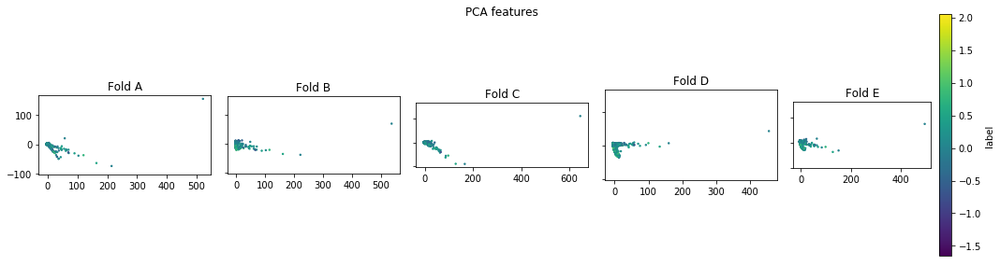

In [146]:
fig, axs = plt.subplots(1, 5, sharey=True, figsize=(15, 4))
for i, f in enumerate(FOLDS):
    ax = axs[i]
    npz = npzs[('msnl', f)]
    plot_projection(
        features=npz['features'][:npairs],
        labels=npz['labels'][:npairs],
        proj='pca',
        ax=ax,
        cbar_name=None if i < 4 else 'label',
        title=f'Fold {f}')
fig.suptitle('PCA features')
fig.tight_layout()
plt.show()

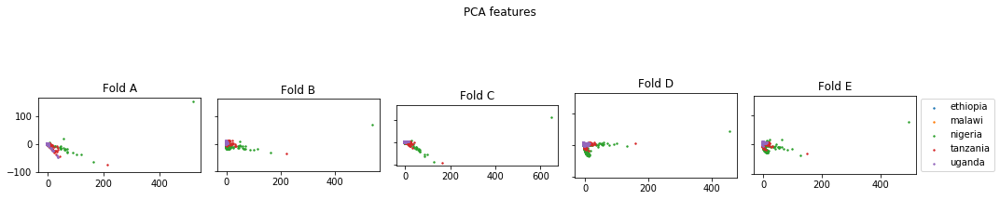

In [147]:
fig, axs = plt.subplots(1, 5, sharey=True, figsize=(15, 4))
for i, f in enumerate(FOLDS):
    ax = axs[i]
    npz = npzs[('msnl', f)]
    plot_projection(
        features=npz['features'][:npairs],
        country_indices=country_indices,
        proj='pca',
        ax=ax,
        title=f'Fold {f}')
axs[-1].legend(loc='center left', bbox_to_anchor=(1, 0.5))
fig.suptitle('PCA features')
fig.tight_layout()
plt.show()

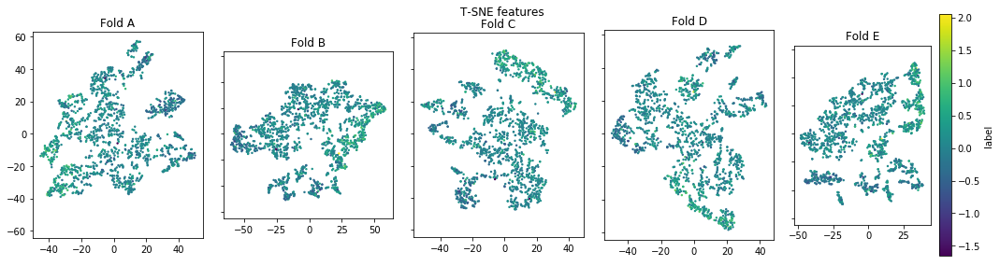

In [151]:
fig, axs = plt.subplots(1, 5, sharey=True, figsize=(15, 4))
for i, f in enumerate(FOLDS):
    ax = axs[i]
    npz = npzs[('msnl', f)]
    plot_projection(
        features=npz['features'][:npairs],
        labels=npz['labels'][:npairs],
        proj='tsne',
        ax=ax,
        cbar_name=None if i < 4 else 'label',
        title=f'Fold {f}')
fig.suptitle('T-SNE features')
fig.tight_layout()
plt.show()

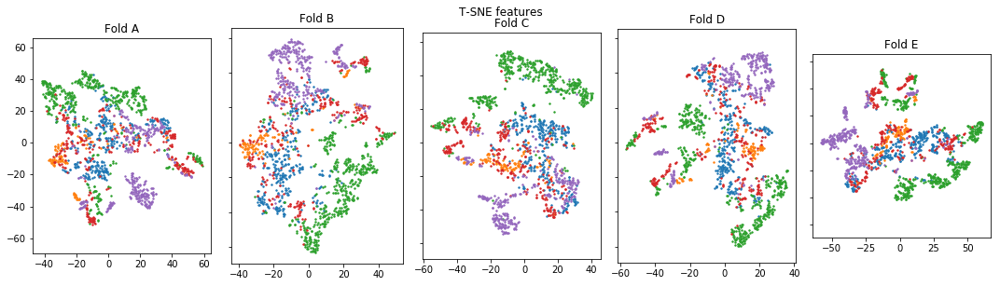

In [153]:
fig, axs = plt.subplots(1, 5, sharey=True, figsize=(15, 4))
for i, f in enumerate(FOLDS):
    ax = axs[i]
    npz = npzs[('msnl', f)]
    plot_projection(
        features=npz['features'][:npairs],
        country_indices=country_indices,
        proj='tsne',
        ax=ax,
        title=f'Fold {f}')
axs[-1].legend(loc='center left', bbox_to_anchor=(1, 0.5))
fig.suptitle('T-SNE features', y=1.02)
fig.tight_layout()
plt.show()

## Evaluate

In [18]:
print_regression_results_by_range(test_preds_df, forward_range, backward_range, zero_range)

overall test results


,r2,R2,mse,rank
preds_ms,0.155568,0.148704,0.0514361,0.317178
preds_msnl,0.156032,0.151869,0.0512449,0.319272
preds_nl,0.0217575,-0.0103142,0.0610441,0.189826


overall test results, only forward prediction


,r2,R2,mse,rank
preds_ms,0.129747,0.128601,0.0990688,0.36327
preds_msnl,0.136141,0.13381,0.0984766,0.366618
preds_nl,0.00911868,-0.00363161,0.114102,0.13461


overall test results, only backward prediction


,r2,R2,mse,rank
preds_ms,0.110995,0.10677,0.101551,0.321081
preds_msnl,0.10498,0.104925,0.10176,0.332325
preds_nl,1.82375e-06,-0.0989706,0.124941,0.0156834


overall test results, only zero prediction


,0
preds_ms,0.00256244
preds_msnl,0.0023712
preds_nl,0.00256651


In [19]:
print_regression_results_by_range(test_preds_df, forward_range, backward_range, zero_range,
                                  weighted=True)

overall test results


,r2,R2,mse,rank
preds_ms,0.176959,0.16598,0.0380463,0.317178
preds_msnl,0.172167,0.163717,0.0381495,0.319272
preds_nl,0.0290484,-0.0141143,0.0462618,0.189826


overall test results, only forward prediction


,r2,R2,mse,rank
preds_ms,0.133461,0.132681,0.0723329,0.36327
preds_msnl,0.140428,0.137673,0.0719166,0.366618
preds_nl,0.00764833,-0.0177263,0.0848766,0.13461


overall test results, only backward prediction


,r2,R2,mse,rank
preds_ms,0.109063,0.0986366,0.0751722,0.321081
preds_msnl,0.0915901,0.0866891,0.0761686,0.332325
preds_nl,8.51025e-06,-0.135974,0.0947382,0.0156834


overall test results, only zero prediction


,0
preds_ms,0.00233999
preds_msnl,0.00225642
preds_nl,0.00271619


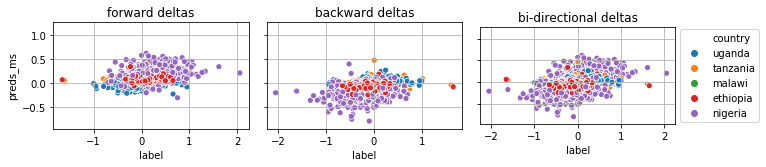

In [20]:
scatterplot_by_country(test_preds_df, col='preds_ms', named_ranges=named_ranges)

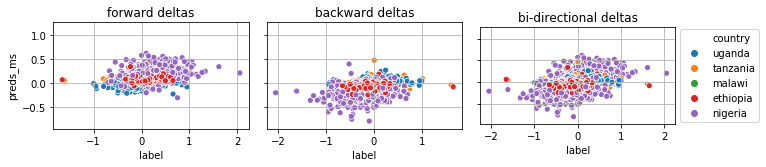

In [21]:
scatterplot_by_country(test_preds_df, col='preds_ms', named_ranges=named_ranges)

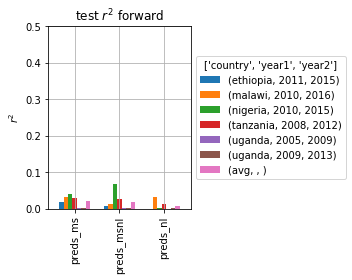

In [22]:
r2_per_band(test_preds_df, named_ranges=[('forward', forward_range)],
            by=['country', 'year1', 'year2'], weighted=True)

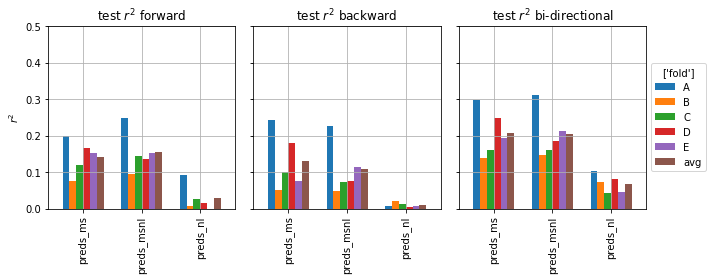

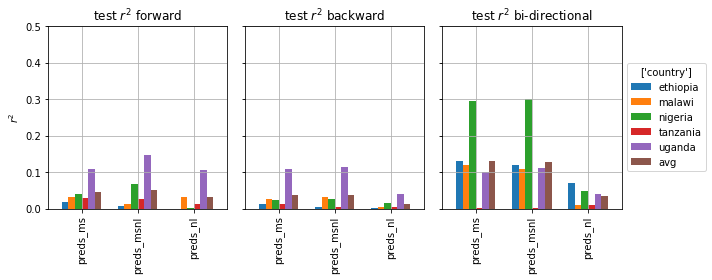

In [23]:
r2_per_band(test_preds_df, named_ranges, by='fold', weighted=True)
r2_per_band(test_preds_df, named_ranges, by='country', weighted=True)

## Fine Tune Final Layer with Cross-Validation

Fold: A


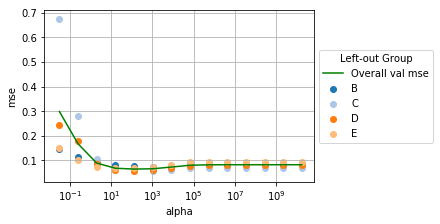

best val mse: 0.065, best alpha: 128.0, test mse: 0.035
Fold: B
best val mse: 0.068, best alpha: 128.0, test mse: 0.043
Fold: C
best val mse: 0.065, best alpha: 128.0, test mse: 0.038
Fold: D
best val mse: 0.068, best alpha: 128.0, test mse: 0.035
Fold: E
best val mse: 0.066, best alpha: 128.0, test mse: 0.044
saving preds to: ../logs/LSMSDeltaIncountry/lsmsdelta_ms/test_preds.npz
saving weights to: ../logs/LSMSDeltaIncountry/lsmsdelta_ms/ridge_weights.npz


In [24]:
run_ridgecv_incountry(
    npzs=npzs, models_dict=MODELS, base_dir=BASE_DIR,
    bands='ms',
    labels=labels_doi_aug,
    locs=locs_aug,
    years1=years1_aug,
    years2=years2_aug,
    group_labels=incountry_group_labels_aug,
    weights=weights_aug)

Fold: A


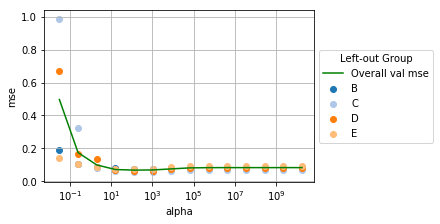

best val mse: 0.068, best alpha: 128.0, test mse: 0.036
Fold: B
best val mse: 0.065, best alpha: 128.0, test mse: 0.043
Fold: C
best val mse: 0.071, best alpha: 1024.0, test mse: 0.034
Fold: D
best val mse: 0.067, best alpha: 128.0, test mse: 0.041
Fold: E
best val mse: 0.064, best alpha: 128.0, test mse: 0.042
saving preds to: ../logs/LSMSDeltaIncountry/lsmsdelta_msnl/test_preds.npz
saving weights to: ../logs/LSMSDeltaIncountry/lsmsdelta_msnl/ridge_weights.npz


In [25]:
run_ridgecv_incountry(
    npzs=npzs, models_dict=MODELS, base_dir=BASE_DIR,
    bands='msnl',
    labels=labels_doi_aug,
    locs=locs_aug,
    years1=years1_aug,
    years2=years2_aug,
    group_labels=incountry_group_labels_aug,
    weights=weights_aug)

Fold: A


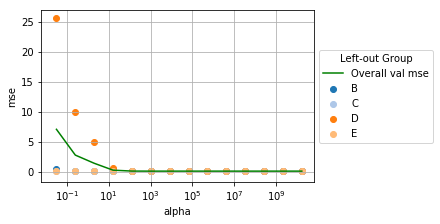

best val mse: 0.082, best alpha: 8192.0, test mse: 0.053
Fold: B
best val mse: 0.083, best alpha: 65536.0, test mse: 0.053
Fold: C
best val mse: 0.086, best alpha: 4194304.0, test mse: 0.046
Fold: D
best val mse: 0.074, best alpha: 128.0, test mse: 0.221
Fold: E
best val mse: 0.081, best alpha: 65536.0, test mse: 0.059
saving preds to: ../logs/LSMSDeltaIncountry/lsmsdelta_nl/test_preds.npz
saving weights to: ../logs/LSMSDeltaIncountry/lsmsdelta_nl/ridge_weights.npz


In [26]:
run_ridgecv_incountry(
    npzs=npzs, models_dict=MODELS, base_dir=BASE_DIR,
    bands='nl',
    labels=labels_doi_aug,
    locs=locs_aug,
    years1=years1_aug,
    years2=years2_aug,
    group_labels=incountry_group_labels_aug,
    weights=weights_aug)

Fold: A


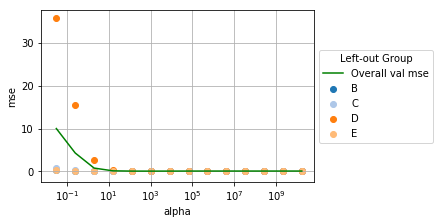

best val mse: 0.066, best alpha: 1024.0, test mse: 0.035
Fold: B
best val mse: 0.083, best alpha: 8192.0, test mse: 0.049
Fold: C
best val mse: 0.074, best alpha: 1024.0, test mse: 0.035
Fold: D
best val mse: 0.067, best alpha: 128.0, test mse: 0.191
Fold: E
best val mse: 0.070, best alpha: 1024.0, test mse: 0.044
saving preds to: ../logs/LSMSDeltaIncountry/lsmsdelta_msnl_concat/test_preds.npz
saving weights to: ../logs/LSMSDeltaIncountry/lsmsdelta_msnl_concat/ridge_weights.npz


In [27]:
run_ridgecv_incountry_concat(
    npzs=npzs, models_dict=MODELS, base_dir=BASE_DIR,
    bands_list=['ms', 'nl'],
    labels=labels_doi_aug,
    locs=locs_aug,
    years1=years1_aug,
    years2=years2_aug,
    group_labels=incountry_group_labels_aug,
    weights=weights_aug)

In [21]:
test_preds_df = load_cv_test_preds(
    base_dir=BASE_DIR,
    bands_list=['ms', 'msnl', 'nl', 'msnl_concat'],
    folds=test_preds_df['fold'].values,
    countries=test_preds_df['country'].values,
    check=dict(labels=labels_doi_aug, locs=locs_aug, weights=weights_aug, years1=years1_aug, years2=years2_aug))

test_preds: dtype=float32, shape=(6156,)
locs: dtype=float32, shape=(6156, 2)
labels: dtype=float32, shape=(6156,)
years1: dtype=int32, shape=(6156,)
years2: dtype=int32, shape=(6156,)
weights: dtype=float64, shape=(6156,)
test_preds: dtype=float32, shape=(6156,)
locs: dtype=float32, shape=(6156, 2)
labels: dtype=float32, shape=(6156,)
years1: dtype=int32, shape=(6156,)
years2: dtype=int32, shape=(6156,)
weights: dtype=float64, shape=(6156,)
test_preds: dtype=float32, shape=(6156,)
locs: dtype=float32, shape=(6156, 2)
labels: dtype=float32, shape=(6156,)
years1: dtype=int32, shape=(6156,)
years2: dtype=int32, shape=(6156,)
weights: dtype=float64, shape=(6156,)
test_preds: dtype=float32, shape=(6156,)
locs: dtype=float32, shape=(6156, 2)
labels: dtype=float32, shape=(6156,)
years1: dtype=int32, shape=(6156,)
years2: dtype=int32, shape=(6156,)
weights: dtype=float64, shape=(6156,)
test_preds: dtype=float32, shape=(6156,)
locs: dtype=float32, shape=(6156, 2)
labels: dtype=float32, shape=(

In [22]:
with pd.option_context('display.max_rows', 4):
    display(test_preds_df)

,label,fold,country,lat,lon,year1,year2,weight,preds_ms,preds_msnl,preds_nl,preds_msnl_concat
0,-0.369128,E,uganda,-0.292248,31.478722,2005,2009,1.270851,-0.215936,-0.127536,0.086198,-0.112509
1,-0.047140,E,uganda,-0.292248,31.478722,2009,2013,1.270851,-0.029313,0.047623,0.086472,0.012234
...,...,...,...,...,...,...,...,...,...,...,...,...
6154,0.000000,E,nigeria,9.917938,11.689417,2015,2015,0.158856,0.131366,0.019815,0.086405,0.143916
6155,0.000000,A,ethiopia,9.991906,37.692554,2015,2015,1.429707,-0.013192,-0.037141,0.086030,-0.018571


In [23]:
forward_preds_df = test_preds_df.loc[slice(*forward_range)]
csv_path = os.path.join('../model_analysis', 'lsmsdelta_preds_incountry.csv')
# forward_preds_df.to_csv(csv_path, index=False)

## Evaluate

In [24]:
print_regression_results_by_range(test_preds_df, forward_range, backward_range, zero_range)

overall test results


,r2,R2,mse,rank
preds_ms,0.14914,0.128625,0.0526493,0.309931
preds_msnl,0.1463,0.130159,0.0525566,0.306755
preds_nl,0.00135666,-0.663186,0.100491,0.095071
preds_msnl_concat,0.0315253,-0.394408,0.0842515,0.253928


overall test results, only forward prediction


,r2,R2,mse,rank
preds_ms,0.141283,0.140321,0.0977363,0.36112
preds_msnl,0.145604,0.144378,0.0972752,0.361222
preds_nl,0.00231851,-0.0598194,0.12049,0.08883
preds_msnl_concat,0.0875871,0.0761415,0.105033,0.355126


overall test results, only backward prediction


,r2,R2,mse,rank
preds_ms,0.0922328,0.0741958,0.105254,0.297733
preds_msnl,0.0973967,0.0902153,0.103433,0.289067
preds_nl,3.78626e-08,-0.816452,0.206511,0.00796978
preds_msnl_concat,0.0032922,-0.678136,0.190786,0.160853


overall test results, only zero prediction


,0
preds_ms,0.00380342
preds_msnl,0.00475921
preds_nl,0.0374818
preds_msnl_concat,0.0205934


In [25]:
print_regression_results_by_range(test_preds_df, forward_range, backward_range, zero_range,
                                  weighted=True)

overall test results


,r2,R2,mse,rank
preds_ms,0.173921,0.146941,0.0389148,0.309931
preds_msnl,0.163257,0.136449,0.0393934,0.306755
preds_nl,0.00143582,-0.967408,0.0897491,0.095071
preds_msnl_concat,0.0328259,-0.614441,0.0736475,0.253928


overall test results, only forward prediction


,r2,R2,mse,rank
preds_ms,0.144128,0.140499,0.0716809,0.36112
preds_msnl,0.157371,0.154707,0.070496,0.361222
preds_nl,0.00184435,-0.0994433,0.0916917,0.08883
preds_msnl_concat,0.0807114,0.0507032,0.0791697,0.355126


overall test results, only backward prediction


,r2,R2,mse,rank
preds_ms,0.0931943,0.0699424,0.0775652,0.297733
preds_msnl,0.0771194,0.0689119,0.0776511,0.289067
preds_nl,8.51715e-05,-1.22762,0.185779,0.00796978
preds_msnl_concat,0.00242778,-1.049,0.170883,0.160853


overall test results, only zero prediction


,0
preds_ms,0.00320652
preds_msnl,0.00471331
preds_nl,0.0407627
preds_msnl_concat,0.0222686


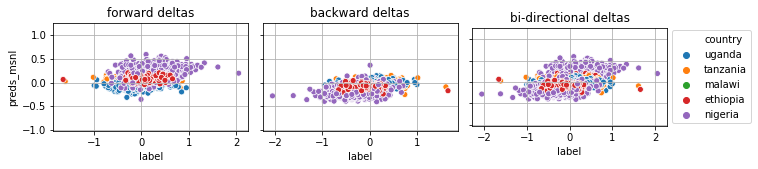

In [26]:
scatterplot_by_country(test_preds_df, col='preds_msnl', named_ranges=named_ranges)

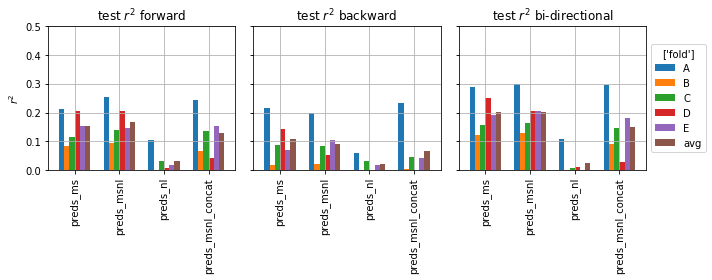

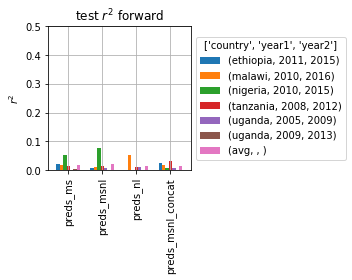

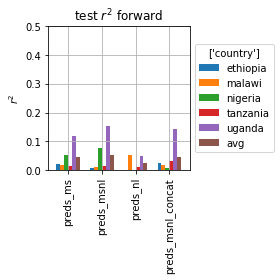

In [34]:
r2_per_band(test_preds_df, named_ranges, by='fold', show_first_df=True, weighted=True)
r2_per_band(test_preds_df, named_ranges=[('forward', forward_range)],
            by=['country', 'year1', 'year2'], show_first_df=True, weighted=True)
r2_per_band(test_preds_df, named_ranges=[('forward', forward_range)],
            by='country', show_first_df=True, weighted=True)

In [35]:
results_bycountryfold_df = (
    forward_preds_df
    .groupby(['country', 'fold', 'year1', 'year2'])
    .apply(evaluate_df, cols=['preds_ms', 'preds_msnl', 'preds_nl']))
colordisplay(results_bycountryfold_df)

## Effect of household size

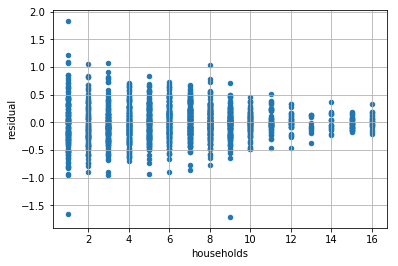

In [25]:
forward_df = pd.merge(forward_preds_df, delta_pairs_df, on=['lat', 'lon', 'country', 'year1', 'year2'])
forward_df['residual'] = forward_df['label'] - forward_df['preds_ms']
ax = forward_df.plot(kind='scatter', x='households', y='residual')
ax.grid(True)

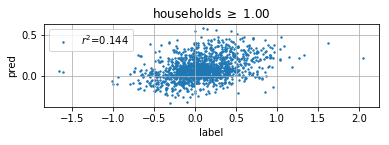

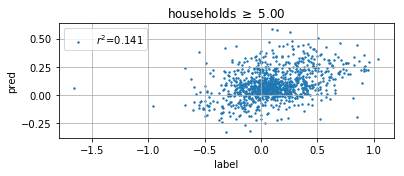

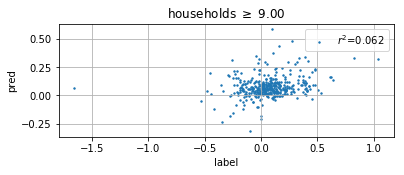

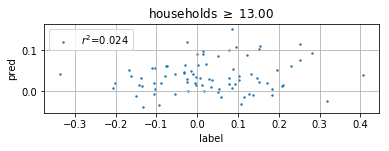

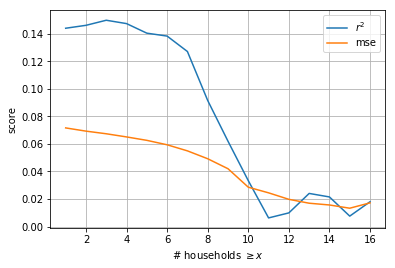

In [37]:
R2s = []
r2s = []
mses = []
hs = sorted(forward_df['households'].unique())
for i, h in enumerate(hs):
    selection = forward_df.loc[forward_df['households'] >= h, :]
    R2 = calc_score(selection['label'], selection['preds_ms'], weights=selection['weight'], metric='R2')
    r2 = calc_score(selection['label'], selection['preds_ms'], weights=selection['weight'], metric='r2')
    mse = calc_score(selection['label'], selection['preds_ms'], weights=selection['weight'], metric='mse')
    R2s.append(R2)
    r2s.append(r2)
    mses.append(mse)

    if i % 4 == 0:
        fig, ax = plt.subplots(1, 1)
        ax.scatter(selection['label'], selection['preds_ms'], s=2, label=f'$r^2$={r2:.3f}')
        ax.set(xlabel='label', ylabel='pred', title=f'households $\geq$ {h:.2f}')
        ax.set_aspect('equal')
        ax.grid(True)
        ax.legend()
        plt.show()
        plt.close()

fig, ax = plt.subplots(1, 1)
ax.plot(hs, r2s, label='$r^2$')
ax.plot(hs, mses, label='mse')
ax.legend()
ax.grid(True)
ax.set(xlabel=r'# households $\geq x$', ylabel='score')
plt.show()

In [38]:
display(forward_df.iloc[:5])
print(len(forward_df))
print(forward_df['households'].min())

,label,fold,country,lat,lon,year1,year2,weight,preds_ms,preds_msnl,preds_nl,preds_msnl_concat,deltaofindex,indexofdelta,geolev1,geolev2,households,tfrecords_index.x,tfrecords_index.y,residual
0,-0.369128,E,uganda,-0.292248,31.478722,2005,2009,1.270851,-0.215936,-0.127536,0.086198,-0.112509,-0.369128,-1.782208,UGA.53,UGA,8,2574,2694,-0.153192
1,-0.047140,E,uganda,-0.292248,31.478722,2009,2013,1.270851,-0.029313,0.047623,0.086472,0.012234,-0.047140,-0.119516,UGA.53,UGA,8,2694,2941,-0.017828
2,-0.211227,B,uganda,-0.439120,31.711950,2005,2009,0.158856,-0.236258,-0.241459,0.089726,0.045090,-0.211227,-2.585721,UGA.35,UGA,1,2573,2693,0.025031
3,0.250289,B,uganda,-0.439120,31.711950,2009,2013,0.158856,0.057118,0.116397,0.089899,0.078218,0.250289,-0.204501,UGA.35,UGA,1,2693,2940,0.193171
4,-0.495684,D,uganda,-0.503361,31.616070,2005,2009,0.794282,-0.188522,-0.164762,-0.137649,-0.220563,-0.495684,-2.342161,UGA.51,UGA,5,2575,2695,-0.307163


1539
1


In [39]:
min_hs = np.arange(1, 14, 2)
min_absdeltas = np.arange(0, 2, 0.25)

r2s = np.zeros([len(min_hs), len(min_absdeltas)])

for i, min_h in enumerate(min_hs):
    for j, min_absdelta in enumerate(min_absdeltas):
        mask = (forward_df['households'] >= min_h) & (forward_df['deltaofindex'].abs() >= min_absdelta)
        if (min_h == 1) and (min_absdelta == 0):
            assert mask.all()
        tmp = forward_df.loc[mask, :]
        if len(tmp) == 0: continue
        r2 = calc_score(labels=tmp['label'], preds=tmp['preds_ms'], weights=tmp['weight'], metric='r2')
        r2s[i, j] = r2

../utils/analysis.py:34: RuntimeWarning: invalid value encountered in double_scalars
  return cov_xy ** 2 / (cov_xx * cov_yy)


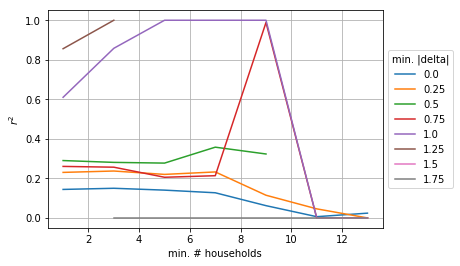

In [40]:
fig, ax = plt.subplots(1, 1)
for j, min_absdelta in enumerate(min_absdeltas):
    ax.plot(min_hs, r2s[:, j], label=str(min_absdelta))
ax.set(xlabel='min. # households', ylabel='$r^2$')
ax.legend(title='min. |delta|', loc='center left', bbox_to_anchor=(1, 0.5))
ax.grid(True)

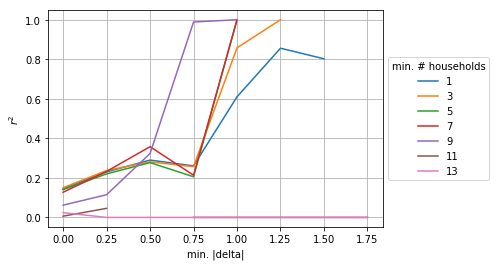

In [41]:
fig, ax = plt.subplots(1, 1)
for i, min_h in enumerate(min_hs):
    ax.plot(min_absdeltas, r2s[i], label=str(min_h))
ax.set(xlabel='min. |delta|', ylabel='$r^2$')
ax.legend(title='min. # households', loc='center left', bbox_to_anchor=(1, 0.5))
ax.grid(True)

## Visualize best and worst predictions

Measure performance on each location as % error, relative to ground truth.

In [21]:
# ONLY RUN THIS SECTION IF USING SAVED CSVS
csv_path = os.path.join('../model_analysis', 'lsmsdelta_preds_incountry.csv')
forward_preds_df = pd.read_csv(csv_path)
forward_preds_df['lat'] = np.float32(forward_preds_df['lat'])
forward_preds_df['lon'] = np.float32(forward_preds_df['lon'])

forward_df = pd.merge(forward_preds_df, delta_pairs_df, on=['lat', 'lon', 'country', 'year1', 'year2'])
forward_df['residual'] = forward_df['label'] - forward_df['preds_msnl']

In [22]:
tfrecord_paths = np.asarray(batcher.get_lsms_tfrecord_paths(dataset_constants.SURVEY_NAMES['LSMS']))
K = 5

In [23]:
print('Largest pred:', forward_df['preds_msnl'].abs().max())

top_k = forward_df['preds_msnl'].abs().sort_values().index[-1:-K-1:-1]
display(forward_df.loc[top_k])

paired_indices = forward_df.loc[top_k, ['tfrecords_index.x', 'tfrecords_index.y']].values
images1 = get_images(tfrecord_paths[paired_indices[:, 0]])
images2 = get_images(tfrecord_paths[paired_indices[:, 1]])

Largest pred: 0.59259343


,label,fold,country,lat,lon,year1,year2,weight,preds_ms,preds_msnl,preds_nl,preds_msnl_concat,deltaofindex,indexofdelta,geolev1,geolev2,households,tfrecords_index.x,tfrecords_index.y,residual
792,0.097340,C,nigeria,11.857120,9.970029,2010,2015,1.588563,0.585873,0.592593,0.093595,0.502003,0.097340,0.074105,NGA.5,NGA,10,1190,1671,-0.488534
839,-0.223613,B,nigeria,12.484247,13.182467,2010,2015,0.953138,0.433942,0.563573,0.089896,0.183233,-0.223613,-0.205584,NGA.8,NGA,6,1169,1650,-0.657554
855,0.417413,B,nigeria,12.698645,8.622388,2010,2015,0.794282,0.451389,0.557801,0.089895,0.180730,0.417413,0.494141,NGA.18,NGA,5,1229,1710,-0.033976
849,0.373060,B,nigeria,12.647582,8.894074,2010,2015,0.953138,0.448851,0.527215,0.089895,0.183076,0.373060,1.013492,NGA.18,NGA,6,1227,1708,-0.075792
1219,0.505985,C,nigeria,6.928557,4.794029,2010,2015,0.953138,0.509929,0.522023,0.093611,0.377205,0.505985,0.076860,NGA.29,NGA,6,1163,1644,-0.003944


Instructions for updating:
Colocations handled automatically by placer.


1-th largest abs. pred (delta-of-index)
label=0.097340, pred=0.592593, % error=508.79
loc = nigeria (11.857120, 9.970029), 10 households, 2010 to 2015


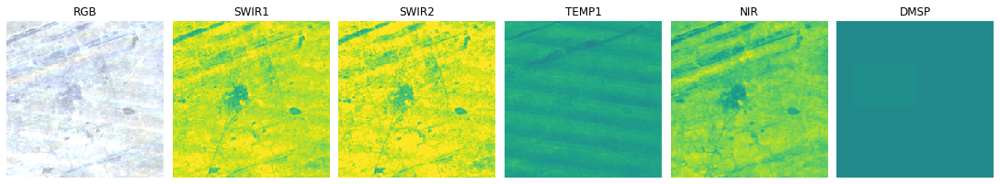

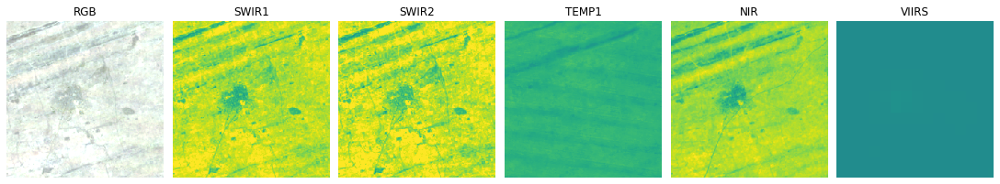

2-th largest abs. pred (delta-of-index)
label=-0.223613, pred=0.563573, % error=-352.03
loc = nigeria (12.484247, 13.182467), 6 households, 2010 to 2015


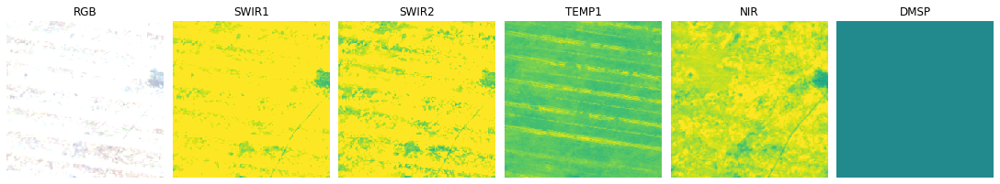

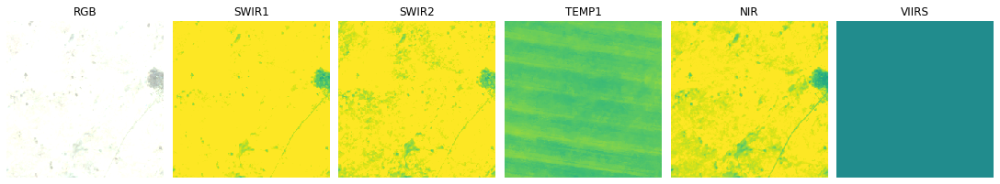

3-th largest abs. pred (delta-of-index)
label=0.417413, pred=0.557801, % error=33.63
loc = nigeria (12.698645, 8.622388), 5 households, 2010 to 2015


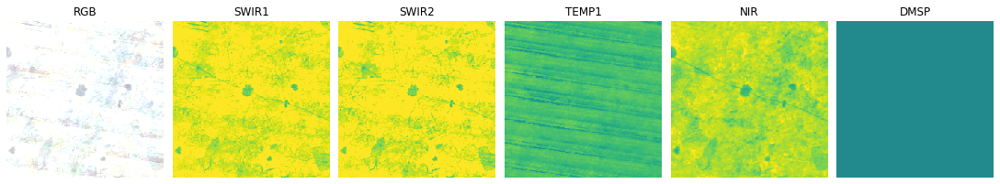

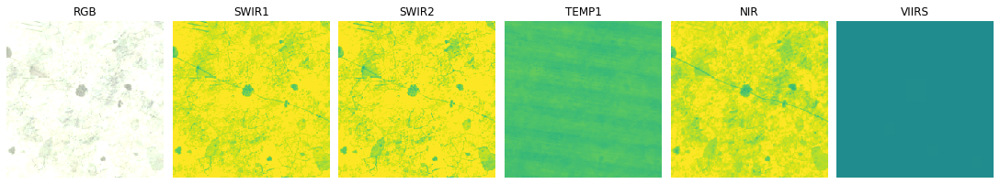

4-th largest abs. pred (delta-of-index)
label=0.373060, pred=0.527215, % error=41.32
loc = nigeria (12.647582, 8.894074), 6 households, 2010 to 2015


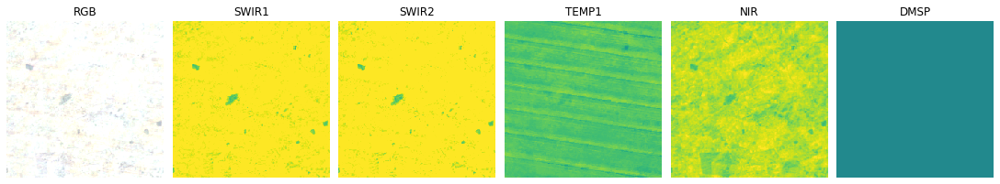

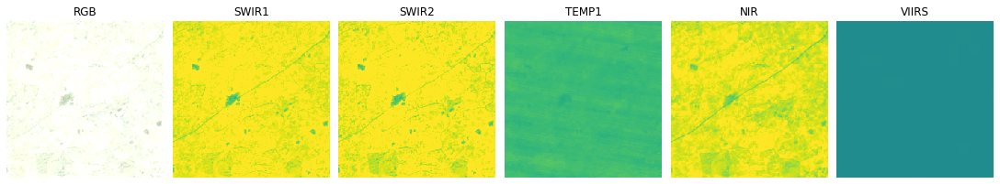

5-th largest abs. pred (delta-of-index)
label=0.505985, pred=0.522023, % error=3.17
loc = nigeria (6.928557, 4.794029), 6 households, 2010 to 2015


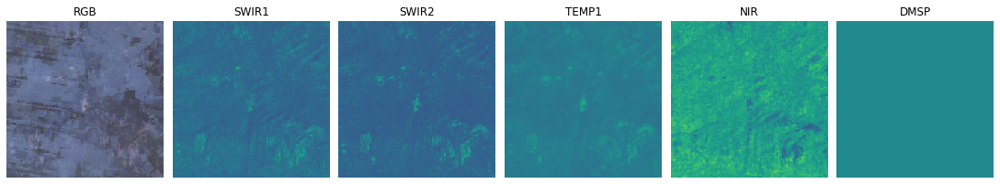

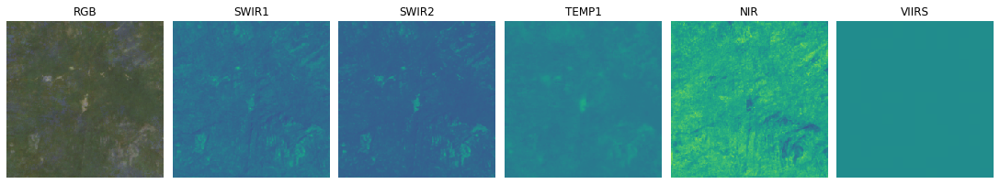

In [24]:
plot_images_by_delta(
    images1, images2,
    order='largest abs. pred (delta-of-index)',
    labels_col='deltaofindex',
    preds_col='preds_msnl',
    df=forward_df.loc[top_k])

In [25]:
perc_error = (forward_df['preds_msnl'] - forward_df['label']) / forward_df['label']
print('lowest % error:', perc_error.abs().min() * 100)

best_k = perc_error.abs().sort_values().index[:K]
display(forward_df.loc[top_k])

paired_indices = forward_df.loc[best_k, ['tfrecords_index.x', 'tfrecords_index.y']].values
images1 = get_images(tfrecord_paths[paired_indices[:, 0]])
images2 = get_images(tfrecord_paths[paired_indices[:, 1]])

lowest % error: 0.22953580749174063


,label,fold,country,lat,lon,year1,year2,weight,preds_ms,preds_msnl,preds_nl,preds_msnl_concat,deltaofindex,indexofdelta,geolev1,geolev2,households,tfrecords_index.x,tfrecords_index.y,residual
792,0.097340,C,nigeria,11.857120,9.970029,2010,2015,1.588563,0.585873,0.592593,0.093595,0.502003,0.097340,0.074105,NGA.5,NGA,10,1190,1671,-0.488534
839,-0.223613,B,nigeria,12.484247,13.182467,2010,2015,0.953138,0.433942,0.563573,0.089896,0.183233,-0.223613,-0.205584,NGA.8,NGA,6,1169,1650,-0.657554
855,0.417413,B,nigeria,12.698645,8.622388,2010,2015,0.794282,0.451389,0.557801,0.089895,0.180730,0.417413,0.494141,NGA.18,NGA,5,1229,1710,-0.033976
849,0.373060,B,nigeria,12.647582,8.894074,2010,2015,0.953138,0.448851,0.527215,0.089895,0.183076,0.373060,1.013492,NGA.18,NGA,6,1227,1708,-0.075792
1219,0.505985,C,nigeria,6.928557,4.794029,2010,2015,0.953138,0.509929,0.522023,0.093611,0.377205,0.505985,0.076860,NGA.29,NGA,6,1163,1644,-0.003944


1-th lowest % error (delta-of-index)
label=0.435100, pred=0.434101, % error=-0.23
loc = nigeria (12.562536, 8.313785), 5 households, 2010 to 2015


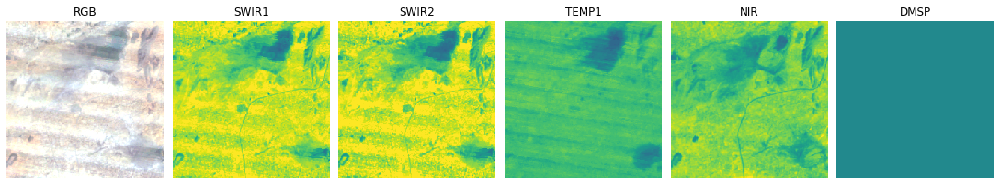

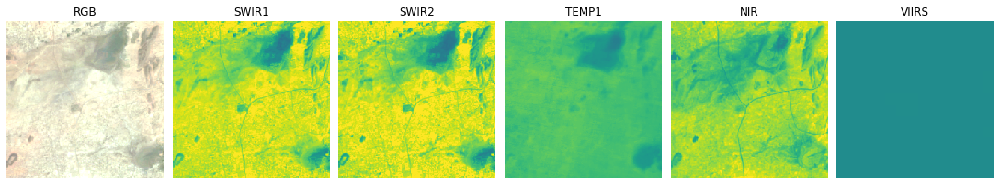

2-th lowest % error (delta-of-index)
label=0.122970, pred=0.123783, % error=0.66
loc = tanzania (-6.177250, 36.475750), 4 households, 2008 to 2012


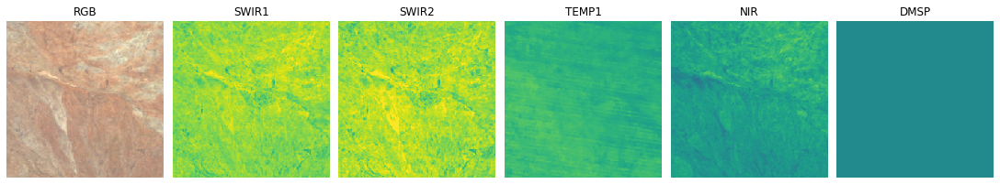

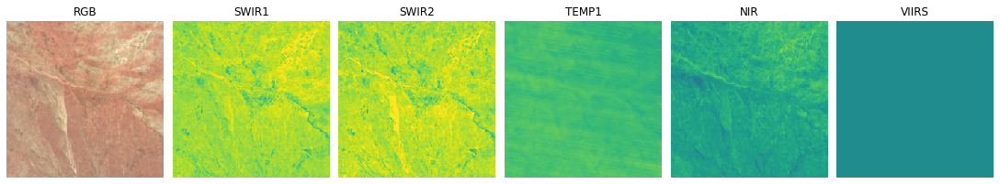

3-th lowest % error (delta-of-index)
label=0.171584, pred=0.173355, % error=1.03
loc = uganda (-0.982337, 30.459738), 8 households, 2009 to 2013


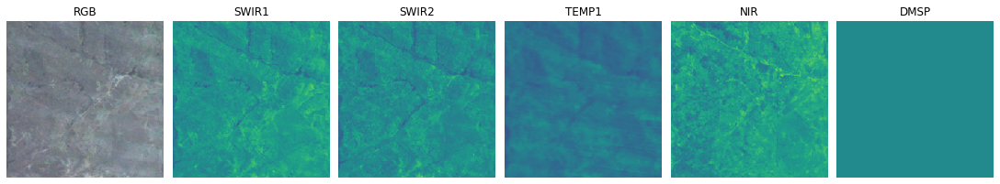

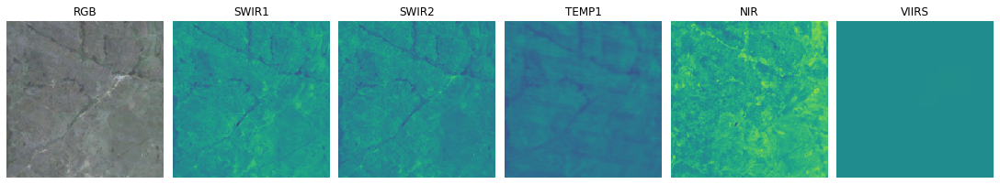

4-th lowest % error (delta-of-index)
label=-0.051910, pred=-0.051222, % error=-1.33
loc = uganda (2.566242, 34.640480), 7 households, 2009 to 2013


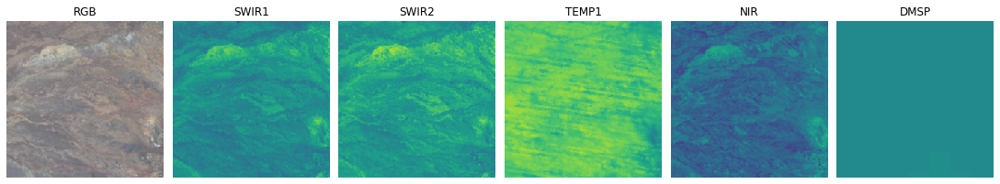

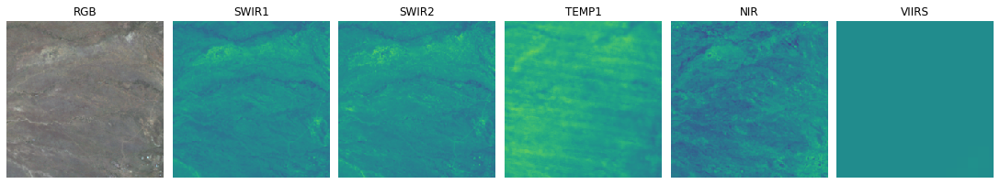

5-th lowest % error (delta-of-index)
label=0.087110, pred=0.085925, % error=-1.36
loc = malawi (-13.274000, 34.140400), 15 households, 2010 to 2016


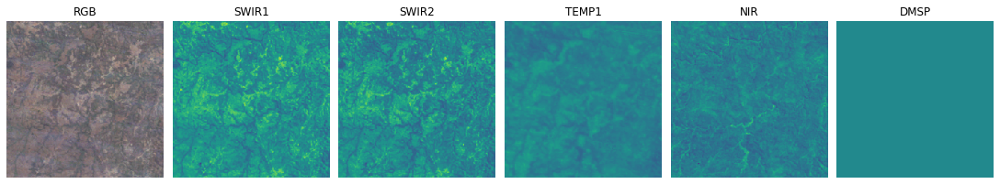

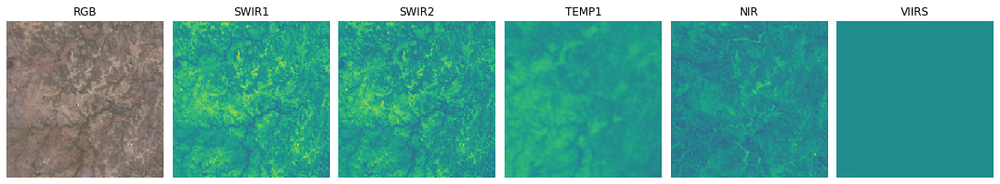

In [26]:
plot_images_by_delta(
    images1, images2,
    order='lowest % error (delta-of-index)',
    labels_col='deltaofindex',
    preds_col='preds_msnl',
    df=forward_df.loc[best_k])

# LSMSIndexOfDeltaIncountry

## Load saved preds + features

In [18]:
BASE_DIR = os.path.join(LOGS_ROOT_DIR, 'LSMSIndexOfDeltaIncountry')
MODELS = {
    ('ms', 'A'): 'LSMSIndexOfDeltaIncountryA_bidir_18preact_ms_random_b64_fc1_conv1_lr0001',
    ('ms', 'B'): 'LSMSIndexOfDeltaIncountryB_bidir_18preact_ms_random_b64_fc1_conv1_lr0001',
    ('ms', 'C'): 'LSMSIndexOfDeltaIncountryC_bidir_18preact_ms_random_b64_fc1_conv1_lr0001',
    ('ms', 'D'): 'LSMSIndexOfDeltaIncountryD_bidir_18preact_ms_random_b64_fc1_conv1_lr0001',
    ('ms', 'E'): 'LSMSIndexOfDeltaIncountryE_bidir_18preact_ms_random_b64_fc01_conv01_lr0001',
    ('msnl', 'A'): 'LSMSIndexOfDeltaIncountryA_bidir_18preact_msnl_random_b64_fc001_conv001_lr0001',
    ('msnl', 'B'): 'LSMSIndexOfDeltaIncountryB_bidir_18preact_msnl_random_b64_fc01_conv01_lr0001',
    ('msnl', 'C'): 'LSMSIndexOfDeltaIncountryC_bidir_18preact_msnl_random_b64_fc1_conv1_lr0001',
    ('msnl', 'D'): 'LSMSIndexOfDeltaIncountryD_bidir_18preact_msnl_random_b64_fc1_conv1_lr0001',
    ('msnl', 'E'): 'LSMSIndexOfDeltaIncountryE_bidir_18preact_msnl_random_b64_fc1_conv1_lr0001',
    ('nl', 'A'): 'LSMSIndexOfDeltaIncountryA_bidir_18preact_nl_random_b64_fc001_conv001_lr0001',
    ('nl', 'B'): 'LSMSIndexOfDeltaIncountryB_bidir_18preact_nl_random_b64_fc001_conv001_lr0001',
    ('nl', 'C'): 'LSMSIndexOfDeltaIncountryC_bidir_18preact_nl_random_b64_fc01_conv01_lr0001',
    ('nl', 'D'): 'LSMSIndexOfDeltaIncountryD_bidir_18preact_nl_random_b64_fc1_conv1_lr0001',
    ('nl', 'E'): 'LSMSIndexOfDeltaIncountryE_bidir_18preact_nl_random_b64_fc01_conv01_lr0001',
}

In [19]:
npzs = {
    model: load_npz(os.path.join(BASE_DIR, model_dir, 'features.npz'),
                    check=dict(locs=locs_aug, labels=labels_iod_aug, years1=years1_aug,
                               years2=years2_aug, weights=weights_aug))
    for model, model_dir in MODELS.items()
}

features: dtype=float32, shape=(6156, 512)
preds: dtype=float32, shape=(6156, 1)
labels: dtype=float32, shape=(6156,)
locs: dtype=float32, shape=(6156, 2)
years1: dtype=int32, shape=(6156,)
years2: dtype=int32, shape=(6156,)
weights: dtype=float32, shape=(6156,)
features: dtype=float32, shape=(6156, 512)
preds: dtype=float32, shape=(6156, 1)
labels: dtype=float32, shape=(6156,)
locs: dtype=float32, shape=(6156, 2)
years1: dtype=int32, shape=(6156,)
years2: dtype=int32, shape=(6156,)
weights: dtype=float32, shape=(6156,)
features: dtype=float32, shape=(6156, 512)
preds: dtype=float32, shape=(6156, 1)
labels: dtype=float32, shape=(6156,)
locs: dtype=float32, shape=(6156, 2)
years1: dtype=int32, shape=(6156,)
years2: dtype=int32, shape=(6156,)
weights: dtype=float32, shape=(6156,)
features: dtype=float32, shape=(6156, 512)
preds: dtype=float32, shape=(6156, 1)
labels: dtype=float32, shape=(6156,)
locs: dtype=float32, shape=(6156, 2)
years1: dtype=int32, shape=(6156,)
years2: dtype=int32, 

In [20]:
test_preds_df = load_test_preds(npzs, labels_aug=labels_iod_aug, bands_list=['ms', 'msnl', 'nl'])
with pd.option_context('display.max_rows', 4):
    display(test_preds_df)

,label,fold,country,lat,lon,year1,year2,weight,preds_ms,preds_msnl,preds_nl
0,-1.782208,E,uganda,-0.292248,31.478722,2005,2009,1.270851,-0.409775,-0.670062,-0.003324
1,-0.119516,E,uganda,-0.292248,31.478722,2009,2013,1.270851,-0.120013,-0.083156,0.001011
...,...,...,...,...,...,...,...,...,...,...,...
6154,0.000000,E,nigeria,9.917938,11.689417,2015,2015,0.158856,0.007259,0.003611,0.010497
6155,0.000000,A,ethiopia,9.991906,37.692554,2015,2015,1.429707,-0.001324,0.035525,0.110830


## PCA & t-SNE features

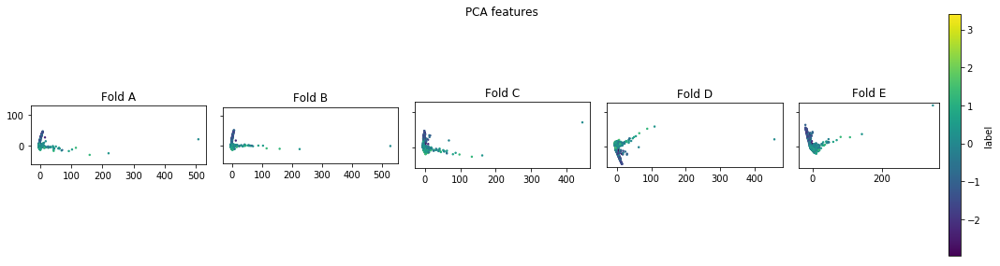

In [21]:
fig, axs = plt.subplots(1, 5, sharey=True, figsize=(15, 4))
for i, f in enumerate(FOLDS):
    ax = axs[i]
    npz = npzs[('msnl', f)]
    plot_projection(
        features=npz['features'][:npairs],
        labels=npz['labels'][:npairs],
        proj='pca',
        ax=ax,
        cbar_name=None if i < 4 else 'label',
        title=f'Fold {f}')
fig.suptitle('PCA features')
fig.tight_layout()
plt.show()

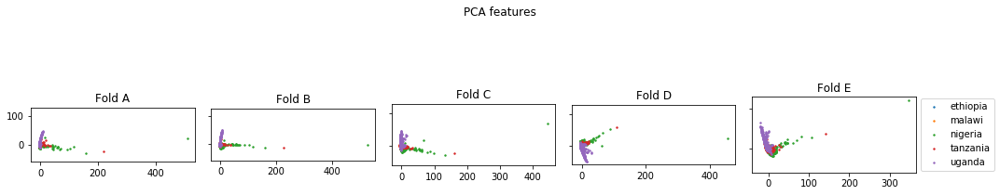

In [22]:
fig, axs = plt.subplots(1, 5, sharey=True, figsize=(15, 4))
for i, f in enumerate(FOLDS):
    ax = axs[i]
    npz = npzs[('msnl', f)]
    plot_projection(
        features=npz['features'][:npairs],
        country_indices=country_indices,
        proj='pca',
        ax=ax,
        title=f'Fold {f}')
axs[-1].legend(loc='center left', bbox_to_anchor=(1, 0.5))
fig.suptitle('PCA features')
fig.tight_layout()
plt.show()

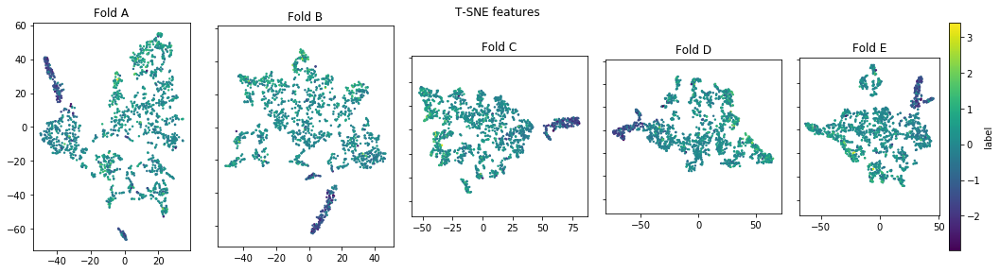

In [23]:
fig, axs = plt.subplots(1, 5, sharey=True, figsize=(15, 4))
for i, f in enumerate(FOLDS):
    ax = axs[i]
    npz = npzs[('msnl', f)]
    plot_projection(
        features=npz['features'][:npairs],
        labels=npz['labels'][:npairs],
        proj='tsne',
        ax=ax,
        cbar_name=None if i < 4 else 'label',
        title=f'Fold {f}')
fig.suptitle('T-SNE features')
fig.tight_layout()
plt.show()

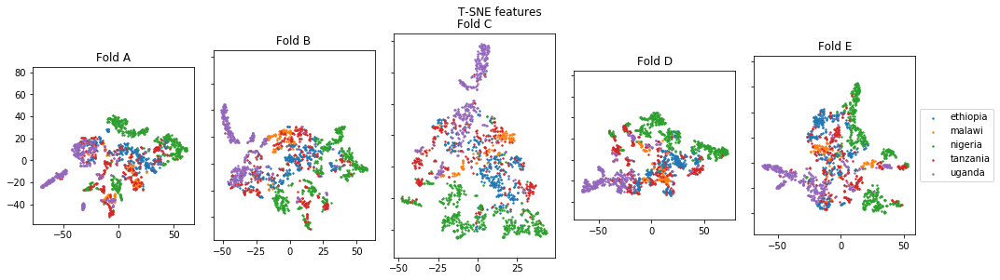

In [25]:
fig, axs = plt.subplots(1, 5, sharey=True, figsize=(15, 4))
for i, f in enumerate(FOLDS):
    ax = axs[i]
    npz = npzs[('msnl', f)]
    plot_projection(
        features=npz['features'][:npairs],
        country_indices=country_indices,
        proj='tsne',
        ax=ax,
        title=f'Fold {f}')
axs[-1].legend(loc='center left', bbox_to_anchor=(1, 0.5))
fig.suptitle('T-SNE features', y=1.02)
fig.tight_layout()
plt.show()

running TSNE...TSNE finished in 7.4 seconds.
running TSNE...TSNE finished in 6.8 seconds.
running TSNE...TSNE finished in 7.0 seconds.
running TSNE...TSNE finished in 7.8 seconds.
running TSNE...TSNE finished in 7.2 seconds.


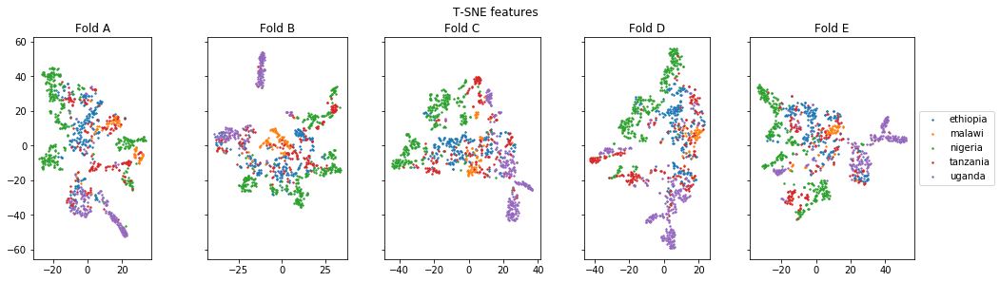

In [39]:
# forward-direction, training examples only
fig, axs = plt.subplots(1, 5, sharey=True, figsize=(15, 4))
for i, f in enumerate(FOLDS):
    ax = axs[i]
    npz = npzs[('msnl', f)]
    country_indices_train = {
        country: np.flatnonzero(delta_pairs_df['country'].values[incountry_train_masks[f]] == country)
        for country in LSMS_COUNTRIES
    }
    plot_projection(
        features=npz['features'][:npairs][incountry_train_masks[f]],
        country_indices=country_indices_train,
        proj='tsne',
        ax=ax,
        title=f'Fold {f}')
axs[-1].legend(loc='center left', bbox_to_anchor=(1, 0.5))
fig.suptitle('T-SNE features', y=1.02)
fig.tight_layout()
plt.show()

## Evaluate

In [45]:
print_regression_results_by_range(test_preds_df, forward_range, backward_range, zero_range)

overall test results


,r2,R2,mse,rank
preds_ms,0.195454,0.171597,0.215771,0.307317
preds_msnl,0.163628,0.139924,0.22402,0.289361
preds_nl,0.0012535,-0.329265,0.346228,0.0742741


overall test results, only forward prediction


,r2,R2,mse,rank
preds_ms,0.299531,0.296863,0.366285,0.41215
preds_msnl,0.242429,0.237782,0.397062,0.416445
preds_nl,0.00242514,-0.413999,0.736594,0.223266


overall test results, only backward prediction


,r2,R2,mse,rank
preds_ms,0.19342,0.161774,0.436657,0.353089
preds_msnl,0.15128,0.135941,0.450114,0.320009
preds_nl,0.00144689,-0.0413876,0.54249,-0.0185109


overall test results, only zero prediction


,0
preds_ms,0.0300704
preds_msnl,0.0244527
preds_nl,0.0529142


In [46]:
print_regression_results_by_range(test_preds_df, forward_range, backward_range, zero_range,
                                  weighted=True)

overall test results


,r2,R2,mse,rank
preds_ms,0.221942,0.194416,0.168468,0.307317
preds_msnl,0.186168,0.152513,0.17723,0.289361
preds_nl,0.0010476,-0.466968,0.306779,0.0742741


overall test results, only forward prediction


,r2,R2,mse,rank
preds_ms,0.358667,0.354303,0.270062,0.41215
preds_msnl,0.287928,0.282007,0.300299,0.416445
preds_nl,0.0021145,-0.591748,0.665746,0.223266


overall test results, only backward prediction


,r2,R2,mse,rank
preds_ms,0.21171,0.174259,0.345365,0.353089
preds_msnl,0.166452,0.144109,0.357975,0.320009
preds_nl,0.0011287,-0.0626702,0.44446,-0.0185109


overall test results, only zero prediction


,0
preds_ms,0.0292218
preds_msnl,0.0253237
preds_nl,0.0584558


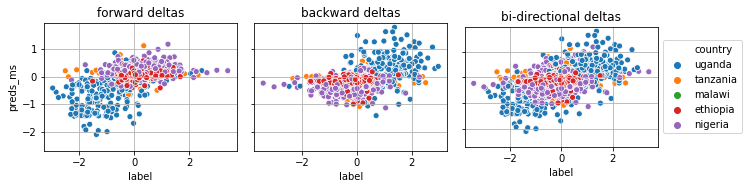

In [47]:
scatterplot_by_country(test_preds_df, col='preds_ms', named_ranges=named_ranges)

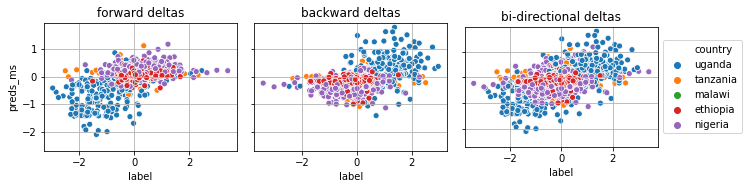

In [48]:
scatterplot_by_country(test_preds_df, col='preds_ms', named_ranges=named_ranges)

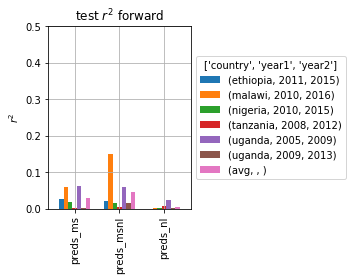

In [49]:
r2_per_band(test_preds_df, named_ranges=[('forward', forward_range)],
            by=['country', 'year1', 'year2'], weighted=True)

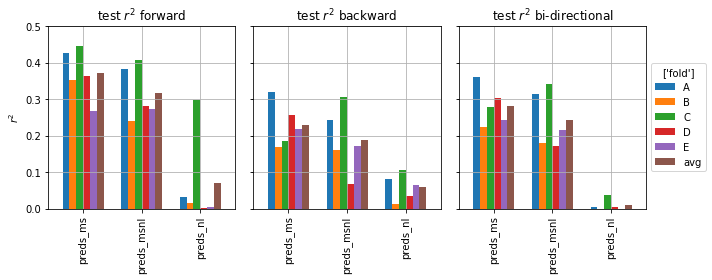

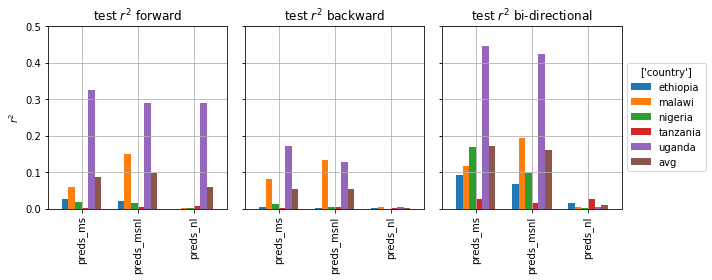

In [50]:
r2_per_band(test_preds_df, named_ranges, by='fold', weighted=True)
r2_per_band(test_preds_df, named_ranges, by='country', weighted=True)

## Fine Tune Final Layer with Cross-Validation

Fold: A


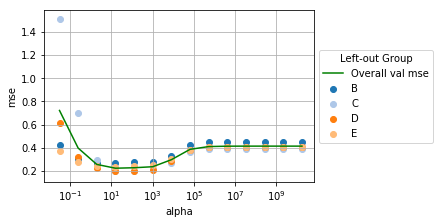

best val mse: 0.224, best alpha: 16.0, test mse: 0.295
Fold: B
best val mse: 0.212, best alpha: 16.0, test mse: 0.382
Fold: C
best val mse: 0.218, best alpha: 16.0, test mse: 0.285
Fold: D
best val mse: 0.235, best alpha: 16.0, test mse: 0.292
Fold: E
best val mse: 0.204, best alpha: 128.0, test mse: 0.198
saving preds to: ../logs/LSMSIndexOfDeltaIncountry/lsmsdelta_ms/test_preds.npz
saving weights to: ../logs/LSMSIndexOfDeltaIncountry/lsmsdelta_ms/ridge_weights.npz


In [23]:
run_ridgecv_incountry(
    npzs=npzs, models_dict=MODELS, base_dir=BASE_DIR,
    bands='ms',
    labels=labels_iod_aug,
    locs=locs_aug,
    years1=years1_aug,
    years2=years2_aug,
    group_labels=incountry_group_labels_aug,
    weights=weights_aug)

Fold: A


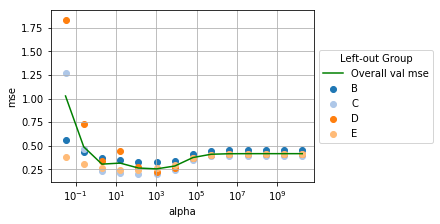

best val mse: 0.253, best alpha: 1024.0, test mse: 0.176
Fold: B
best val mse: 0.212, best alpha: 128.0, test mse: 0.220
Fold: C
best val mse: 0.218, best alpha: 128.0, test mse: 0.180
Fold: D
best val mse: 0.228, best alpha: 128.0, test mse: 0.231
Fold: E
best val mse: 0.222, best alpha: 16.0, test mse: 0.249
saving preds to: ../logs/LSMSIndexOfDeltaIncountry/lsmsdelta_msnl/test_preds.npz
saving weights to: ../logs/LSMSIndexOfDeltaIncountry/lsmsdelta_msnl/ridge_weights.npz


In [24]:
run_ridgecv_incountry(
    npzs=npzs, models_dict=MODELS, base_dir=BASE_DIR,
    bands='msnl',
    labels=labels_iod_aug,
    locs=locs_aug,
    years1=years1_aug,
    years2=years2_aug,
    group_labels=incountry_group_labels_aug,
    weights=weights_aug)

Fold: A


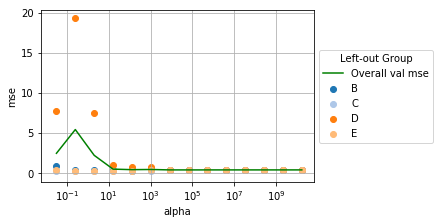

best val mse: 0.412, best alpha: 65536.0, test mse: 0.221
Fold: B
best val mse: 0.301, best alpha: 128.0, test mse: 0.414
Fold: C
best val mse: 0.311, best alpha: 16.0, test mse: 1.092
Fold: D
best val mse: 0.272, best alpha: 128.0, test mse: 1.174
Fold: E
best val mse: 0.377, best alpha: 2.0, test mse: 0.481
saving preds to: ../logs/LSMSIndexOfDeltaIncountry/lsmsdelta_nl/test_preds.npz
saving weights to: ../logs/LSMSIndexOfDeltaIncountry/lsmsdelta_nl/ridge_weights.npz


In [25]:
run_ridgecv_incountry(
    npzs=npzs, models_dict=MODELS, base_dir=BASE_DIR,
    bands='nl',
    labels=labels_iod_aug,
    locs=locs_aug,
    years1=years1_aug,
    years2=years2_aug,
    group_labels=incountry_group_labels_aug,
    weights=weights_aug)

Fold: A


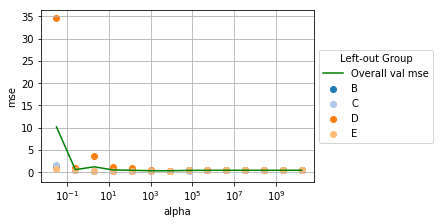

best val mse: 0.304, best alpha: 8192.0, test mse: 0.185
Fold: B
best val mse: 0.233, best alpha: 1024.0, test mse: 0.252
Fold: C
best val mse: 0.215, best alpha: 128.0, test mse: 0.396
Fold: D
best val mse: 0.226, best alpha: 128.0, test mse: 0.444
Fold: E
best val mse: 0.205, best alpha: 128.0, test mse: 0.201
saving preds to: ../logs/LSMSIndexOfDeltaIncountry/lsmsdelta_msnl_concat/test_preds.npz
saving weights to: ../logs/LSMSIndexOfDeltaIncountry/lsmsdelta_msnl_concat/ridge_weights.npz


In [38]:
run_ridgecv_incountry_concat(
    npzs=npzs, models_dict=MODELS, base_dir=BASE_DIR,
    bands_list=['ms', 'nl'],
    labels=labels_iod_aug,
    locs=locs_aug,
    years1=years1_aug,
    years2=years2_aug,
    group_labels=incountry_group_labels_aug,
    weights=weights_aug)

In [21]:
test_preds_df = load_cv_test_preds(
    base_dir=BASE_DIR,
    bands_list=['ms', 'msnl', 'nl', 'msnl_concat'],
    folds=test_preds_df['fold'].values,
    countries=test_preds_df['country'].values,
    check=dict(labels=labels_iod_aug, locs=locs_aug, weights=weights_aug, years1=years1_aug, years2=years2_aug))

test_preds: dtype=float32, shape=(6156,)
locs: dtype=float32, shape=(6156, 2)
labels: dtype=float32, shape=(6156,)
years1: dtype=int32, shape=(6156,)
years2: dtype=int32, shape=(6156,)
weights: dtype=float64, shape=(6156,)
test_preds: dtype=float32, shape=(6156,)
locs: dtype=float32, shape=(6156, 2)
labels: dtype=float32, shape=(6156,)
years1: dtype=int32, shape=(6156,)
years2: dtype=int32, shape=(6156,)
weights: dtype=float64, shape=(6156,)
test_preds: dtype=float32, shape=(6156,)
locs: dtype=float32, shape=(6156, 2)
labels: dtype=float32, shape=(6156,)
years1: dtype=int32, shape=(6156,)
years2: dtype=int32, shape=(6156,)
weights: dtype=float64, shape=(6156,)
test_preds: dtype=float32, shape=(6156,)
locs: dtype=float32, shape=(6156, 2)
labels: dtype=float32, shape=(6156,)
years1: dtype=int32, shape=(6156,)
years2: dtype=int32, shape=(6156,)
weights: dtype=float64, shape=(6156,)
test_preds: dtype=float32, shape=(6156,)
locs: dtype=float32, shape=(6156, 2)
labels: dtype=float32, shape=(

In [22]:
with pd.option_context('display.max_rows', 4):
    display(test_preds_df)

,label,fold,country,lat,lon,year1,year2,weight,preds_ms,preds_msnl,preds_nl,preds_msnl_concat
0,-1.782208,E,uganda,-0.292248,31.478722,2005,2009,1.270851,-0.905384,-1.125500,-1.053320,-0.899473
1,-0.119516,E,uganda,-0.292248,31.478722,2009,2013,1.270851,-0.118080,-0.170430,0.150498,-0.112563
...,...,...,...,...,...,...,...,...,...,...,...,...
6154,0.000000,E,nigeria,9.917938,11.689417,2015,2015,0.158856,-0.082577,0.166755,-0.065066,-0.089099
6155,0.000000,A,ethiopia,9.991906,37.692554,2015,2015,1.429707,-0.080642,-0.090347,0.005562,0.006147


In [23]:
forward_preds_df = test_preds_df.loc[slice(*forward_range)]
csv_path = os.path.join('../model_analysis', 'lsms_indexofdelta_preds_incountry.csv')
# forward_preds_df.to_csv(csv_path, index=False)

## Evaluate

In [24]:
print_regression_results_by_range(test_preds_df, forward_range, backward_range, zero_range)

overall test results


,r2,R2,mse,rank
preds_ms,0.121167,-0.280317,0.333479,0.246817
preds_msnl,0.134002,0.00559858,0.259008,0.252368
preds_nl,0.00666332,-1.75219,0.716851,0.0879245
preds_msnl_concat,0.100244,-0.306616,0.340329,0.240946


overall test results, only forward prediction


,r2,R2,mse,rank
preds_ms,0.353004,0.351995,0.337565,0.440915
preds_msnl,0.318535,0.315829,0.356405,0.43053
preds_nl,0.0683561,-0.186903,0.618293,0.183381
preds_msnl_concat,0.313183,0.313095,0.357829,0.417139


overall test results, only backward prediction


,r2,R2,mse,rank
preds_ms,0.0953858,-0.349061,0.702766,0.197544
preds_msnl,0.0835832,-0.0206733,0.531699,0.228724
preds_nl,6.76713e-05,-1.48766,1.2959,-0.00766411
preds_msnl_concat,0.0730073,-0.371784,0.714603,0.195411


overall test results, only zero prediction


,0
preds_ms,0.146792
preds_msnl,0.0739631
preds_nl,0.476607
preds_msnl_concat,0.144441


In [25]:
print_regression_results_by_range(test_preds_df, forward_range, backward_range, zero_range,
                                  weighted=True)

overall test results


,r2,R2,mse,rank
preds_ms,0.125851,-0.385974,0.289842,0.246817
preds_msnl,0.15194,-0.0136159,0.211972,0.252368
preds_nl,0.00686087,-2.27579,0.68505,0.0879245
preds_msnl_concat,0.104128,-0.425466,0.2981,0.240946


overall test results, only forward prediction


,r2,R2,mse,rank
preds_ms,0.415818,0.414901,0.244717,0.440915
preds_msnl,0.385016,0.382181,0.258402,0.43053
preds_nl,0.0797522,-0.28153,0.535998,0.183381
preds_msnl_concat,0.370993,0.370745,0.263185,0.417139


overall test results, only backward prediction


,r2,R2,mse,rank
preds_ms,0.0840981,-0.494514,0.625078,0.197544
preds_msnl,0.0856164,-0.0542094,0.440921,0.228724
preds_nl,0.000582416,-1.95207,1.2347,-0.00766411
preds_msnl_concat,0.0647617,-0.523161,0.637059,0.195411


overall test results, only zero prediction


,0
preds_ms,0.144786
preds_msnl,0.0742829
preds_nl,0.484751
preds_msnl_concat,0.146078


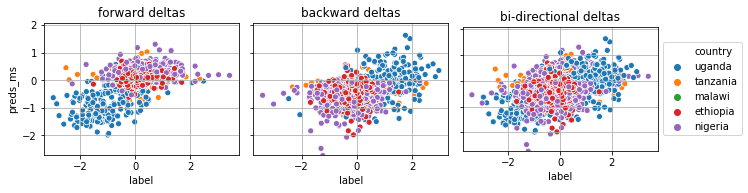

In [26]:
scatterplot_by_country(test_preds_df, col='preds_ms', named_ranges=named_ranges)

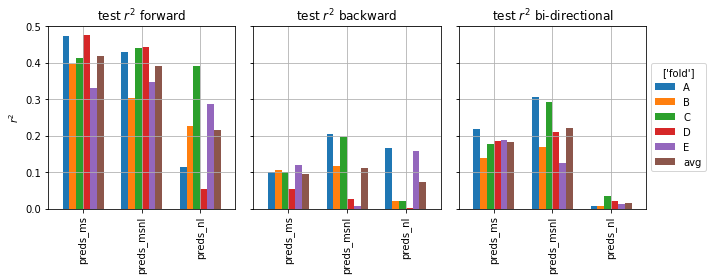

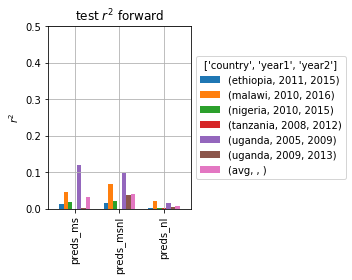

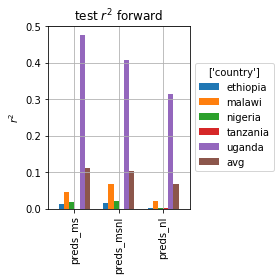

In [32]:
r2_per_band(test_preds_df, named_ranges, by='fold', show_first_df=True, weighted=True)
r2_per_band(test_preds_df, named_ranges=[('forward', forward_range)],
            by=['country', 'year1', 'year2'], show_first_df=True, weighted=True)
r2_per_band(test_preds_df, named_ranges=[('forward', forward_range)],
            by='country', show_first_df=True, weighted=True)

In [33]:
results_bycountryfold_df = (
    forward_preds_df
    .groupby(['country', 'fold', 'year1', 'year2'])
    .apply(evaluate_df, cols=['preds_ms', 'preds_msnl', 'preds_nl']))
colordisplay(results_bycountryfold_df)

## Effect of household size

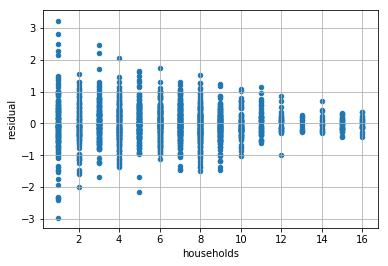

In [35]:
forward_df = pd.merge(forward_preds_df, delta_pairs_df, on=['lat', 'lon', 'country', 'year1', 'year2'])
forward_df['residual'] = forward_df['label'] - forward_df['preds_ms']
ax = forward_df.plot(kind='scatter', x='households', y='residual')
ax.grid(True)

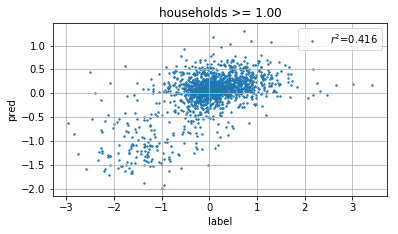

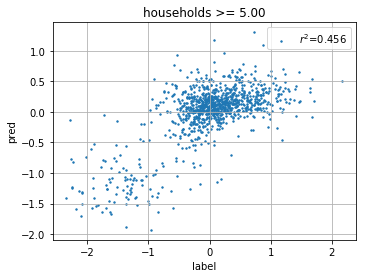

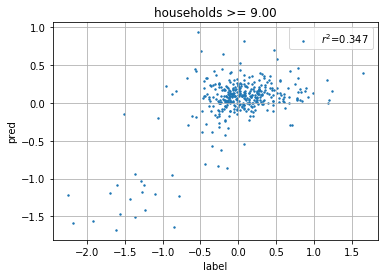

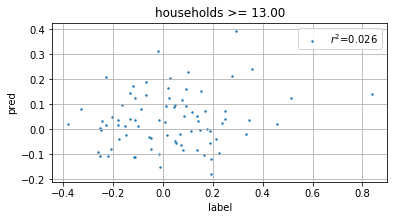

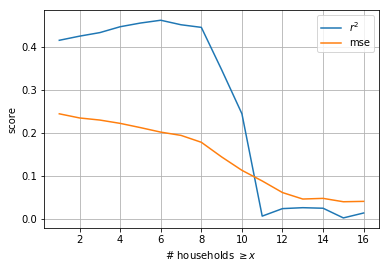

In [35]:
R2s = []
r2s = []
mses = []
hs = sorted(forward_df['households'].unique())
for i, h in enumerate(hs):
    selection = forward_df.loc[forward_df['households'] >= h, :]
    R2 = calc_score(selection['label'], selection['preds_ms'], weights=selection['weight'], metric='R2')
    r2 = calc_score(selection['label'], selection['preds_ms'], weights=selection['weight'], metric='r2')
    mse = calc_score(selection['label'], selection['preds_ms'], weights=selection['weight'], metric='mse')
    R2s.append(R2)
    r2s.append(r2)
    mses.append(mse)

    if i % 4 == 0:
        fig, ax = plt.subplots(1, 1)
        ax.scatter(selection['label'], selection['preds_ms'], s=2, label=f'$r^2$={r2:.3f}')
        ax.set(xlabel='label', ylabel='pred', title=f'households $\geq$ {h:.2f}')
        ax.set_aspect('equal')
        ax.grid(True)
        ax.legend()
        plt.show()
        plt.close()

fig, ax = plt.subplots(1, 1)
ax.plot(hs, r2s, label='$r^2$')
ax.plot(hs, mses, label='mse')
ax.legend()
ax.grid(True)
ax.set(xlabel=r'# households $\geq x$', ylabel='score')
plt.show()

In [58]:
display(forward_df.iloc[:5])
print(len(forward_df))
print(forward_df['households'].min())

,label,fold,country,lat,lon,year1,year2,weight,preds_ms,preds_msnl,preds_nl,preds_msnl_concat,deltaofindex,indexofdelta,geolev1,geolev2,households,tfrecords_index.x,tfrecords_index.y,residual
0,-1.782208,E,uganda,-0.292248,31.478722,2005,2009,1.270851,-0.905384,-1.125500,-1.053320,-0.899473,-0.369128,-1.782208,UGA.53,UGA,8,2574,2694,-0.876824
1,-0.119516,E,uganda,-0.292248,31.478722,2009,2013,1.270851,-0.118080,-0.170430,0.150498,-0.112563,-0.047140,-0.119516,UGA.53,UGA,8,2694,2941,-0.001436
2,-2.585721,B,uganda,-0.439120,31.711950,2005,2009,0.158856,-1.589552,-1.641643,-0.823295,-0.929613,-0.211227,-2.585721,UGA.35,UGA,1,2573,2693,-0.996169
3,-0.204501,B,uganda,-0.439120,31.711950,2009,2013,0.158856,0.063878,-0.200939,0.106162,0.146734,0.250289,-0.204501,UGA.35,UGA,1,2693,2940,-0.268380
4,-2.342161,D,uganda,-0.503361,31.616070,2005,2009,0.794282,-1.404543,-1.470979,-1.129338,-1.244908,-0.495684,-2.342161,UGA.51,UGA,5,2575,2695,-0.937618


1539
1


In [59]:
min_hs = np.arange(1, 14, 2)
min_absdeltas = np.arange(0, 2, 0.25)

r2s = np.zeros([len(min_hs), len(min_absdeltas)])

for i, min_h in enumerate(min_hs):
    for j, min_absdelta in enumerate(min_absdeltas):
        mask = (forward_df['households'] >= min_h) & (forward_df['indexofdelta'].abs() >= min_absdelta)
        if (min_h == 1) and (min_absdelta == 0):
            assert mask.all()
        tmp = forward_df.loc[mask, :]
        if len(tmp) == 0: continue
        r2 = calc_score(labels=tmp['label'], preds=tmp['preds_ms'], weights=tmp['weight'], metric='r2')
        r2s[i, j] = r2

../utils/analysis.py:34: RuntimeWarning: invalid value encountered in double_scalars
  return cov_xy ** 2 / (cov_xx * cov_yy)


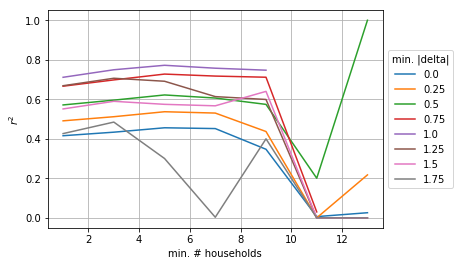

In [38]:
fig, ax = plt.subplots(1, 1)
for j, min_absdelta in enumerate(min_absdeltas):
    ax.plot(min_hs, r2s[:, j], label=str(min_absdelta))
ax.set(xlabel='min. # households', ylabel='$r^2$')
ax.legend(title='min. |delta|', loc='center left', bbox_to_anchor=(1, 0.5))
ax.grid(True)

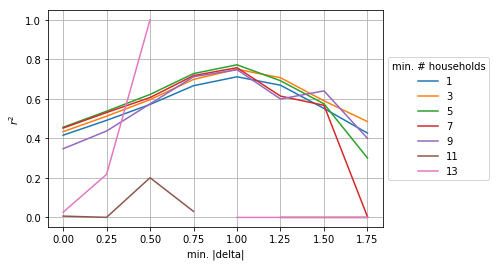

In [39]:
fig, ax = plt.subplots(1, 1)
for i, min_h in enumerate(min_hs):
    ax.plot(min_absdeltas, r2s[i], label=str(min_h))
ax.set(xlabel='min. |delta|', ylabel='$r^2$')
ax.legend(title='min. # households', loc='center left', bbox_to_anchor=(1, 0.5))
ax.grid(True)

## Visualize best and worst predictions

Measure performance on each location as % error, relative to ground truth.

In [21]:
# ONLY RUN THIS SECTION IF USING SAVED CSVS
csv_path = os.path.join('../model_analysis', 'lsms_indexofdelta_preds_incountry.csv')
forward_preds_df = pd.read_csv(csv_path)
forward_preds_df['lat'] = np.float32(forward_preds_df['lat'])
forward_preds_df['lon'] = np.float32(forward_preds_df['lon'])

forward_df = pd.merge(forward_preds_df, delta_pairs_df, on=['lat', 'lon', 'country', 'year1', 'year2'])
forward_df['residual'] = forward_df['label'] - forward_df['preds_ms']

In [28]:
tfrecord_paths = np.asarray(batcher.get_lsms_tfrecord_paths(dataset_constants.SURVEY_NAMES['LSMS']))
K = 5

In [29]:
print('Largest pred:', forward_df['preds_ms'].abs().max())

top_k = forward_df['preds_ms'].abs().sort_values().index[-1:-K-1:-1]
display(forward_df.loc[top_k])

paired_indices = forward_df.loc[top_k, ['tfrecords_index.x', 'tfrecords_index.y']].values
images1 = get_images(tfrecord_paths[paired_indices[:, 0]])
images2 = get_images(tfrecord_paths[paired_indices[:, 1]])

Largest pred: 1.9840296999999998


,label,fold,country,lat,lon,year1,year2,weight,preds_ms,preds_msnl,preds_nl,preds_msnl_concat,deltaofindex,indexofdelta,geolev1,geolev2,households,tfrecords_index.x,tfrecords_index.y,residual
464,-0.985644,E,uganda,0.213035,31.052639,2005,2009,0.635425,-1.984030,-1.906393,-1.053320,-1.975814,-0.258477,-0.985644,UGA.43,UGA,4,2601,2718,0.998386
510,-0.959541,A,uganda,0.358215,30.085194,2005,2009,1.111994,-1.928623,-2.125541,-0.024127,-0.878074,0.138260,-0.959541,UGA.21,UGA,7,2523,2716,0.969082
626,-1.374045,E,uganda,1.361871,31.451387,2005,2009,0.794282,-1.876159,-1.788191,-1.053320,-1.871510,-0.502686,-1.374045,UGA.9,UGA,5,2598,2733,0.502114
608,-2.109485,A,uganda,1.020718,31.124214,2005,2009,1.270851,-1.712052,-1.504609,-0.024127,-0.820391,-0.308555,-2.109485,UGA.24,UGA,8,2656,2723,-0.397433
562,-1.617253,D,uganda,0.625763,33.288773,2005,2009,1.429707,-1.676766,-1.756424,-1.171451,-1.611261,-0.157111,-1.617253,UGA.11,UGA,9,2550,2837,0.059513


Instructions for updating:
Colocations handled automatically by placer.


1-th largest abs. pred (index-of-delta)
label=-0.985644, pred=-1.984030, % error=101.29
loc = uganda (0.213035, 31.052639), 4 households, 2005 to 2009


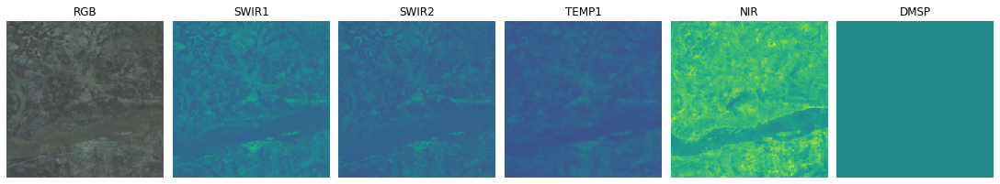

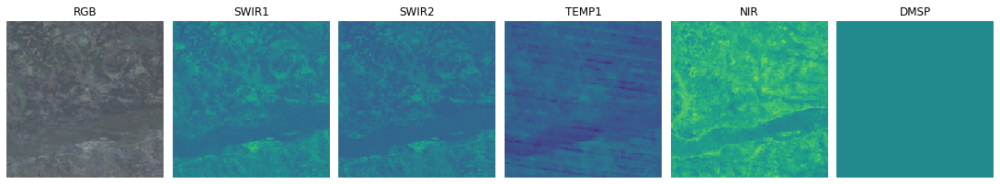

2-th largest abs. pred (index-of-delta)
label=-0.959541, pred=-1.928623, % error=100.99
loc = uganda (0.358215, 30.085194), 7 households, 2005 to 2009


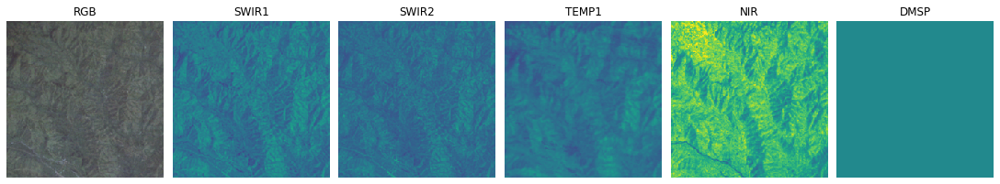

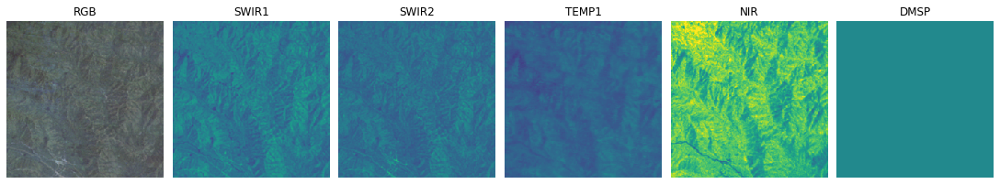

3-th largest abs. pred (index-of-delta)
label=-1.374045, pred=-1.876159, % error=36.54
loc = uganda (1.361871, 31.451387), 5 households, 2005 to 2009


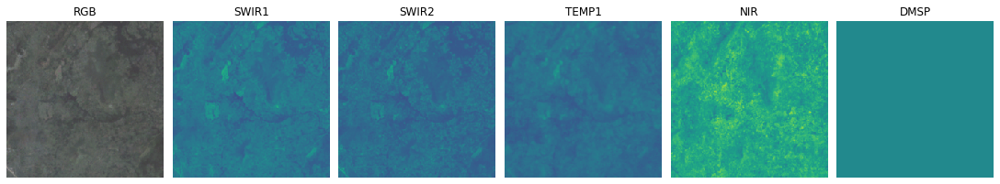

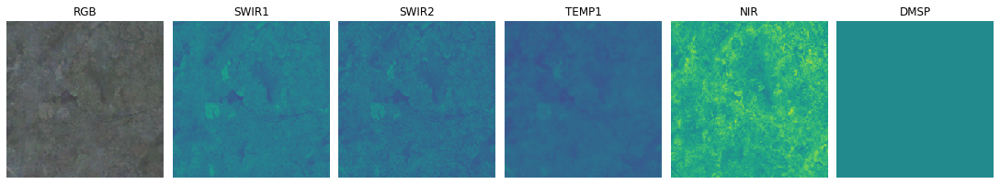

4-th largest abs. pred (index-of-delta)
label=-2.109485, pred=-1.712052, % error=-18.84
loc = uganda (1.020718, 31.124214), 8 households, 2005 to 2009


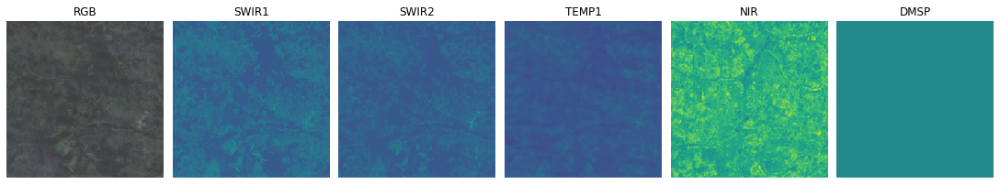

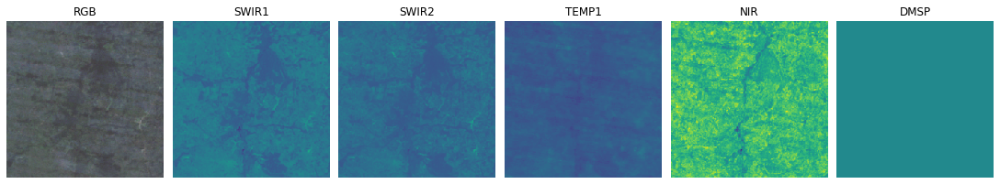

5-th largest abs. pred (index-of-delta)
label=-1.617253, pred=-1.676766, % error=3.68
loc = uganda (0.625763, 33.288773), 9 households, 2005 to 2009


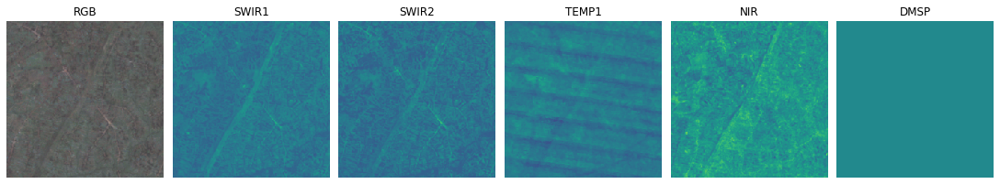

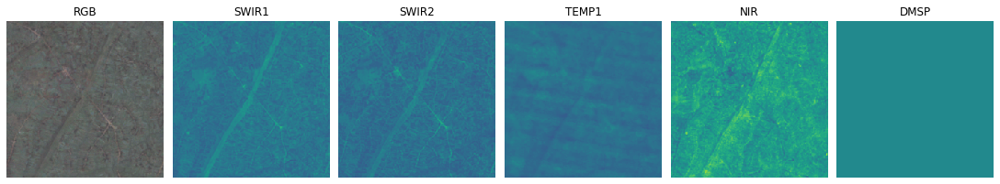

In [30]:
plot_images_by_delta(
    images1, images2,
    order='largest abs. pred (index-of-delta)',
    labels_col='indexofdelta',
    preds_col='preds_ms',
    df=forward_df.loc[top_k])

In [31]:
perc_error = (forward_df['preds_ms'] - forward_df['label']) / forward_df['label']
print('lowest % error:', perc_error.abs().min() * 100)

best_k = perc_error.abs().sort_values().index[:K]
display(forward_df.loc[top_k])

paired_indices = forward_df.loc[best_k, ['tfrecords_index.x', 'tfrecords_index.y']].values
images1 = get_images(tfrecord_paths[paired_indices[:, 0]])
images2 = get_images(tfrecord_paths[paired_indices[:, 1]])

lowest % error: 0.029506219106764923


,label,fold,country,lat,lon,year1,year2,weight,preds_ms,preds_msnl,preds_nl,preds_msnl_concat,deltaofindex,indexofdelta,geolev1,geolev2,households,tfrecords_index.x,tfrecords_index.y,residual
464,-0.985644,E,uganda,0.213035,31.052639,2005,2009,0.635425,-1.984030,-1.906393,-1.053320,-1.975814,-0.258477,-0.985644,UGA.43,UGA,4,2601,2718,0.998386
510,-0.959541,A,uganda,0.358215,30.085194,2005,2009,1.111994,-1.928623,-2.125541,-0.024127,-0.878074,0.138260,-0.959541,UGA.21,UGA,7,2523,2716,0.969082
626,-1.374045,E,uganda,1.361871,31.451387,2005,2009,0.794282,-1.876159,-1.788191,-1.053320,-1.871510,-0.502686,-1.374045,UGA.9,UGA,5,2598,2733,0.502114
608,-2.109485,A,uganda,1.020718,31.124214,2005,2009,1.270851,-1.712052,-1.504609,-0.024127,-0.820391,-0.308555,-2.109485,UGA.24,UGA,8,2656,2723,-0.397433
562,-1.617253,D,uganda,0.625763,33.288773,2005,2009,1.429707,-1.676766,-1.756424,-1.171451,-1.611261,-0.157111,-1.617253,UGA.11,UGA,9,2550,2837,0.059513


1-th lowest % error (index-of-delta)
label=0.749537, pred=0.749316, % error=-0.03
loc = nigeria (9.058589, 3.550321), 7 households, 2010 to 2015


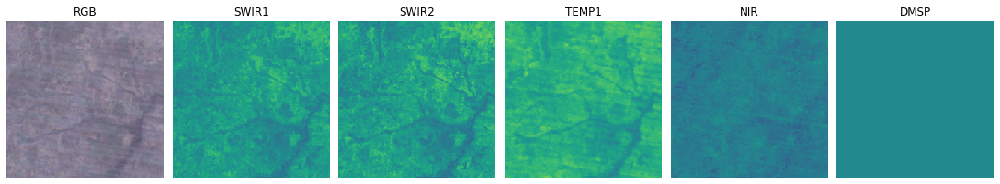

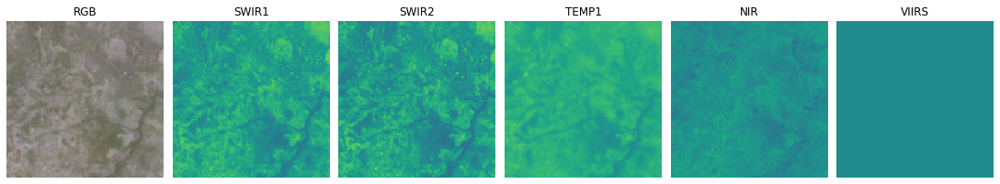

2-th lowest % error (index-of-delta)
label=-1.047719, pred=-1.043700, % error=-0.38
loc = uganda (0.350127, 32.669987), 5 households, 2005 to 2009


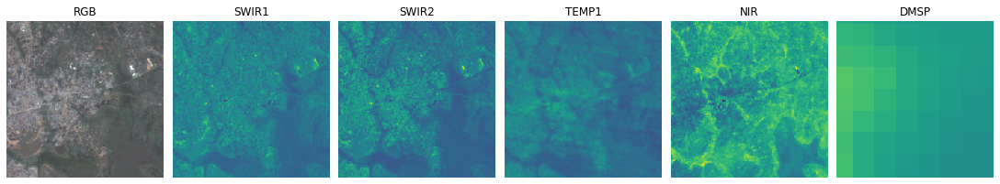

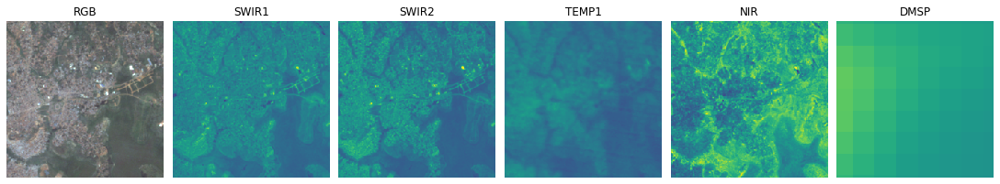

3-th lowest % error (index-of-delta)
label=-1.622707, pred=-1.631690, % error=0.55
loc = uganda (-0.553773, 30.303692), 8 households, 2005 to 2009


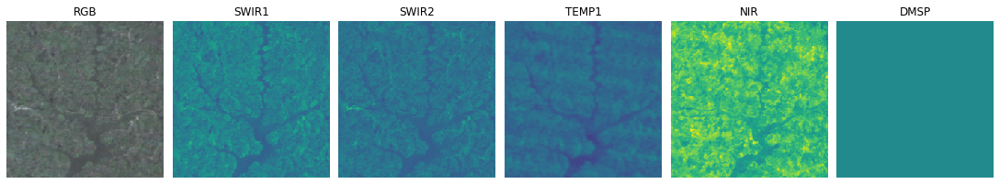

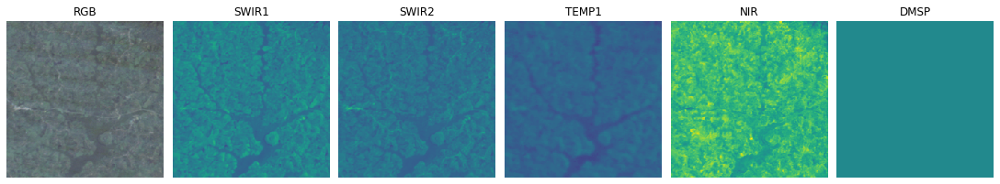

4-th lowest % error (index-of-delta)
label=0.151324, pred=0.152472, % error=0.76
loc = malawi (-15.399200, 35.318401), 14 households, 2010 to 2016


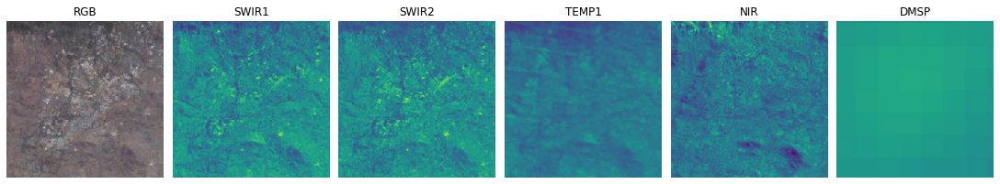

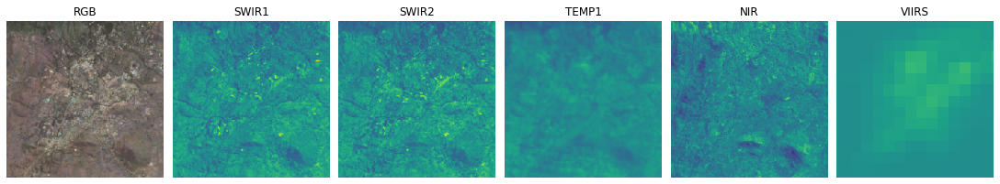

5-th lowest % error (index-of-delta)
label=0.348996, pred=0.351689, % error=0.77
loc = ethiopia (13.842605, 39.719643), 7 households, 2011 to 2015


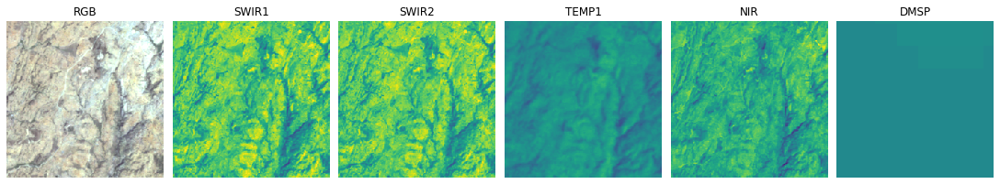

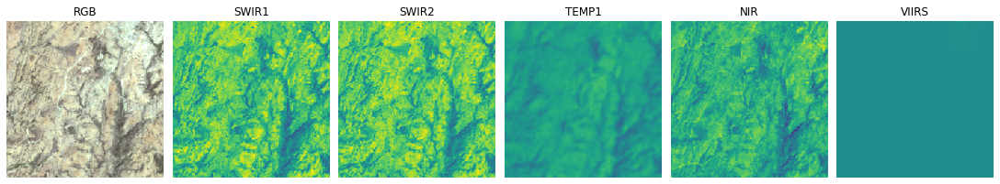

In [32]:
plot_images_by_delta(
    images1, images2,
    order='lowest % error (index-of-delta)',
    labels_col='indexofdelta',
    preds_col='preds_ms',
    df=forward_df.loc[best_k])

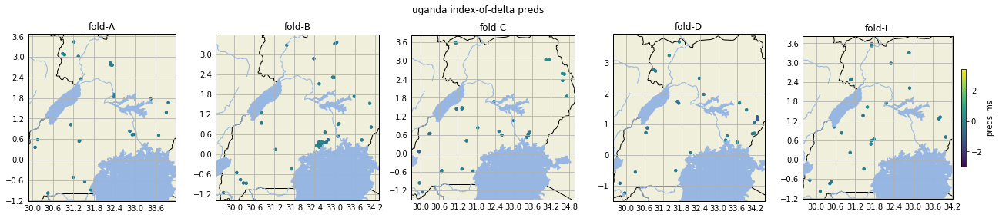

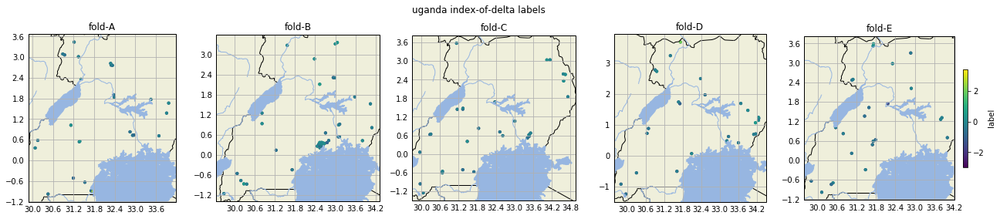

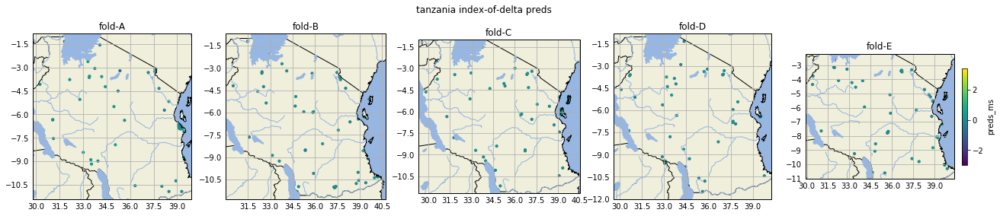

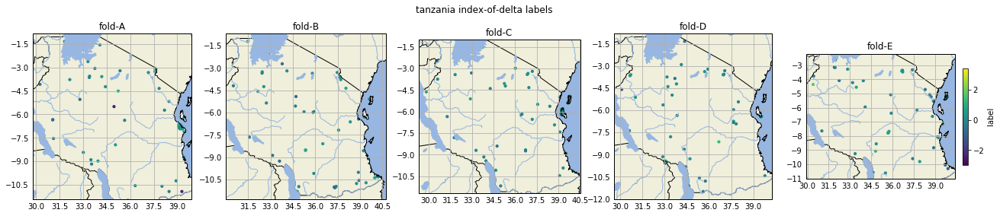

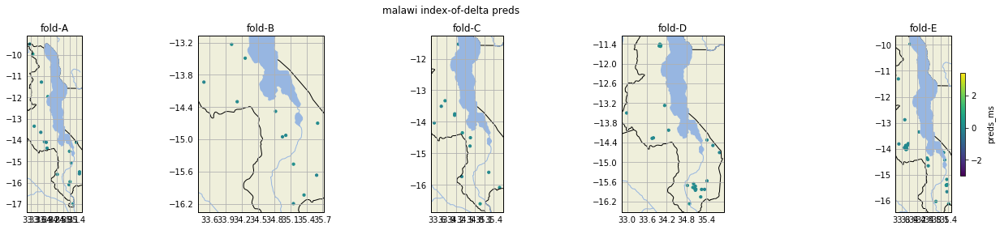

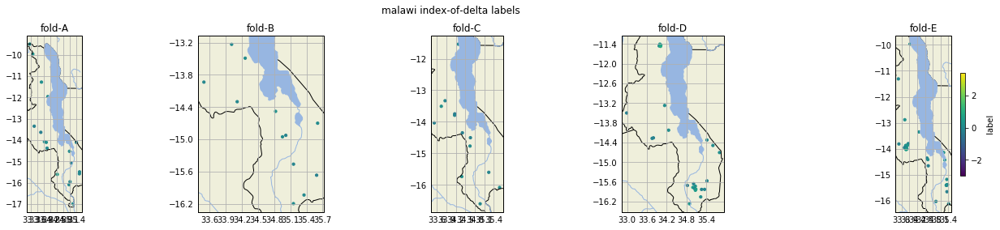

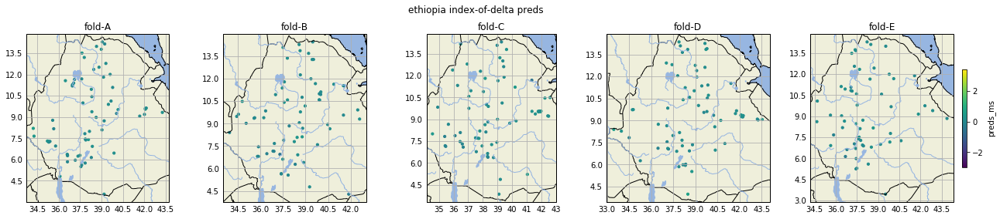

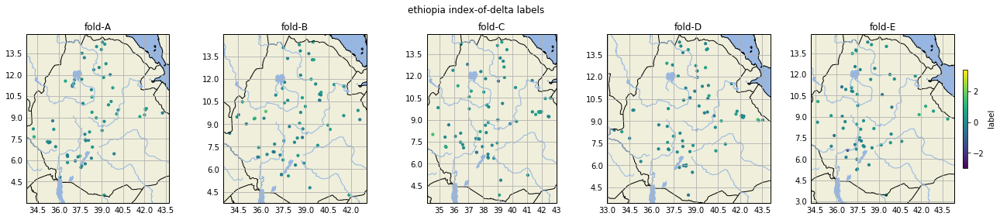

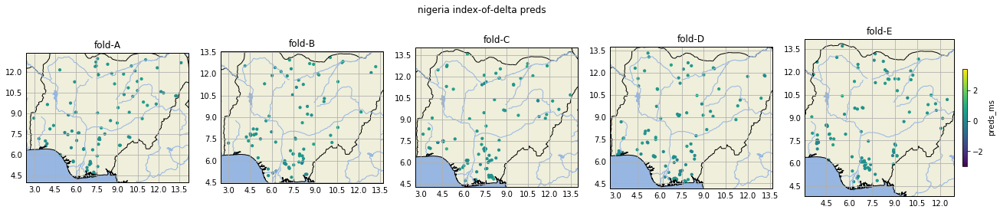

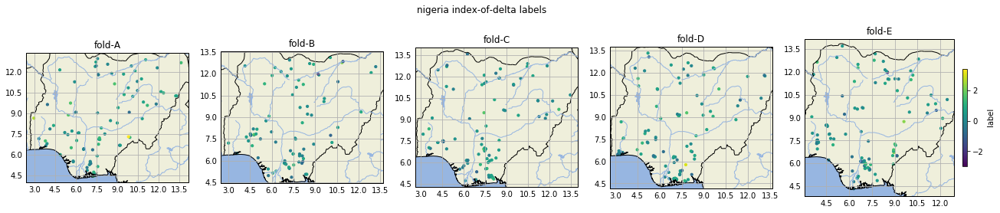

In [22]:
def plot_preds_by_fold_country():
    vmin = min(forward_preds_df['preds_ms'].min(), forward_preds_df['label'].min())
    vmax = max(forward_preds_df['preds_ms'].max(), forward_preds_df['label'].max())
    for c in forward_preds_df['country'].unique():
        # fig, axs = plt.subplots(1, 5, sharey=True, figsize=(20, 4))
        fig = plt.figure(figsize=(22, 4))
        for i, f in enumerate(['A', 'B', 'C', 'D', 'E']):
            subset_df = forward_preds_df[(forward_preds_df['country'] == c) & (forward_preds_df['fold'] == f)]
            plot_locs(fig=fig, pos=(1, 5, i+1), locs=subset_df[['lat', 'lon']].values,
                      colors=subset_df['preds_ms'].values, show_cbar=(i==4),
                      title=f'fold-{f}', cbar_label='preds_ms',
                      vmin=vmin, vmax=vmax, s=10)
        fig.suptitle(f'{c} index-of-delta preds', y=1.01)

        fig = plt.figure(figsize=(22, 4))
        for i, f in enumerate(['A', 'B', 'C', 'D', 'E']):
            subset_df = forward_preds_df[(forward_preds_df['country'] == c) & (forward_preds_df['fold'] == f)]
            plot_locs(fig=fig, pos=(1, 5, i+1), locs=subset_df[['lat', 'lon']].values,
                      colors=subset_df['label'].values, show_cbar=(i==4),
                      title=f'fold-{f}', cbar_label='label',
                      vmin=vmin, vmax=vmax, s=10)
        fig.suptitle(f'{c} index-of-delta labels', y=1.01)
        plt.show()

plot_preds_by_fold_country()

## Variation by geolevel

label  preds_ms
fold geolev1                    
A    ETH.10   0.281022  0.121386
     ETH.11   0.169703  0.136575
     ETH.2    0.068881  0.264028
     ETH.3    0.343766  0.089933
     ETH.5    0.290094  0.091220
...                ...       ...
E    UGA.52   0.714944  0.036028
     UGA.53   1.175700  0.556708
     UGA.56   0.557495  0.010845
     UGA.8    0.411720  0.549977
     UGA.9    0.575084  1.057211

[462 rows x 2 columns]

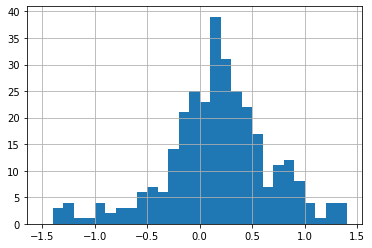

In [24]:
stds = forward_df.groupby(['fold', 'geolev1'])[['label', 'preds_ms']].std()
display(stds)

stds_norm = stds.copy()
stds_norm['label'] /= forward_df['label'].std()
stds_norm['preds_ms'] /= forward_df['preds_ms'].std()
(stds_norm['label'] - stds_norm['preds_ms']).hist(bins=np.arange(-1.5, 1.5, 0.1))

In [25]:
def weighted_std(x, weights):
    mean = np.average(x, weights=weights)
    var = np.average((x - mean)**2, weights=weights)
    return np.sqrt(var / (len(x) - 1))

def apply_weighted_std(df, weights_col):
    cols = list(df.columns)
    cols.remove(weights_col)
    weights = df[weights_col]
    result = {c: weighted_std(df[c], weights) for c in cols}
    return pd.Series(result)

label  preds_ms
fold geolev1                    
A    ETH.10   0.058891  0.026766
     ETH.11   0.070879  0.055482
     ETH.2    0.047942  0.183766
     ETH.3    0.074710  0.019651
     ETH.5    0.163994  0.051707
...                ...       ...
E    UGA.52   0.505542  0.025476
     UGA.53   0.831346  0.393652
     UGA.56   0.393331  0.007652
     UGA.8    0.291130  0.388893
     UGA.9    0.406646  0.747561

[462 rows x 2 columns]

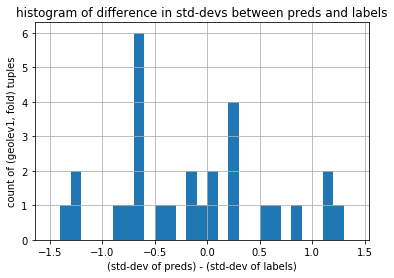

In [27]:
stds = forward_df.groupby(['fold', 'geolev1'])[['label', 'preds_ms', 'households']].apply(apply_weighted_std, weights_col='households')
display(stds)

stds_norm = stds.copy()
stds_norm['label'] /= weighted_std(forward_df['label'], weights=forward_df['households'])
stds_norm['preds_ms'] /= weighted_std(forward_df['preds_ms'], weights=forward_df['households'])
ax = (stds_norm['label'] - stds_norm['preds_ms']).hist(bins=np.arange(-1.5, 1.5, 0.1))
ax.set_title('histogram of difference in std-devs between preds and labels')
ax.set_ylabel('count of (geolev1, fold) tuples')
ax.set_xlabel('(std-dev of preds) - (std-dev of labels)')
plt.show()